# Imports

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from ete3 import Tree
import pickle
from torch import nn
import torch
import seaborn as sns
import umap
from sklearn.decomposition import PCA
from statsmodels.nonparametric.smoothers_lowess import lowess

from plotting import kp_color_domain, nice_colors, single_tree_plot, interactive_plot, get_tsne, NAN_COLOR_VALUE
from scores import get_perm_dists, get_expected_lac_bmtm_height_perm
from model import TreeGeneModel, AutoEncoder
from training import train, optimize_weights, train_triplet
from tree_util import get_node_and_edge_data, get_top_down_cluster_ids, augment_tree_with_weights, make_binary_tree
from perm_util import split_by_type, get_permutation_ids, extract_subsets_with_height
from sim_util import generate_bmtm_data_from_tree, generate_noise_data_from_tree, get_lognorm_expression_tedsim, get_cell_types_tedsim

data_path = './data'
results_path = './results'

# Load data and make cell type legend

# of cells: 1112
type                
AT2-like                667
Lung progenitor-like    214
AT1-like                114
High plasticity          67
Gastric-like             17
Pre-EMT                  15
Early EMT-1              11
Early EMT-2               3
Endoderm-like             3
Early gastric             1
dtype: int64


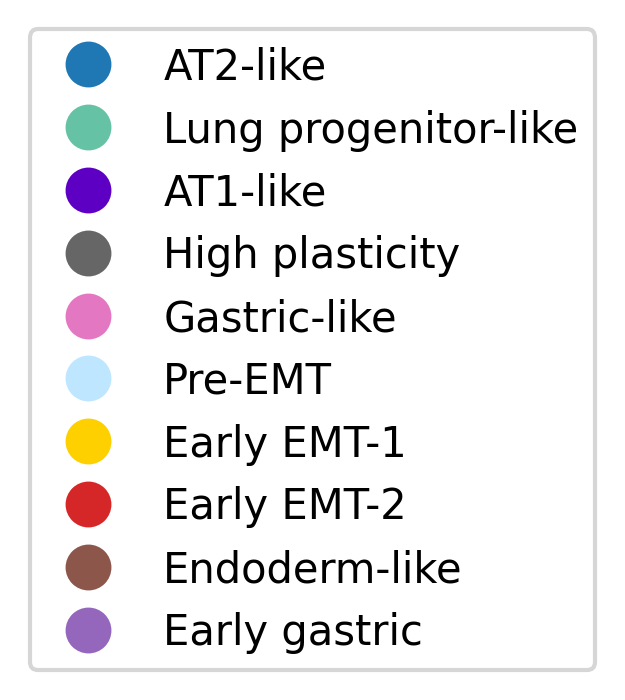

In [20]:
name = '3435_NT_T1'

tree_path = f'{data_path}/preprocessed/{name}_pruned.nwk'
lut_path = f'{data_path}/preprocessed/{name}_apn_pd_triplet_lut.npy'
with open(f'{data_path}/preprocessed/{name}_cells.txt') as f:
  labels_in_order = np.array(f.read().splitlines())

cell_types = pd.read_csv(f'{data_path}/preprocessed/{name}_cell_types.txt', header=None)
cell_types.columns = ['type']
cell_types.index = labels_in_order

color_df = pd.DataFrame(index=kp_color_domain)
color_df['color'] = nice_colors
color_df = color_df.loc[cell_types['type'].value_counts().index]

with open(f'{data_path}/preprocessed/{name}_hvg_genes.txt') as f:
  hvg_genes = np.array(f.read().splitlines())

expression = pd.read_csv(f'{data_path}/preprocessed/{name}_normalized_log_counts.txt')
expression.index = labels_in_order

cv = cell_types.value_counts()
main_types = ['All'] + [t[0] for t in cv.index[:4]]
cv = cell_types.value_counts()
print('# of cells:', len(cell_types))
print(cv)

legend_elements = []
for color, cell_type in zip(color_df['color'], color_df.index):
  legend_elements.append(Line2D([0], [0], marker='o', lw=0, color=color, label=cell_type, markersize=10))

fig, ax = plt.subplots(figsize=(2, 2), dpi=300)
ax.axis('off')
ax.legend(handles=legend_elements, loc='center', ncol=1)
fig.tight_layout()
fig.show()

In [7]:
name = '3435_NT_T1'
f'{data_path}/preprocessed/{name}_pruned.nwk'

'./data/preprocessed/3435_NT_T1_pruned.nwk'

# AE training

The cells below are for training different autoencoder architectures to reconstruct the expression of the 100 most highly variable genes, referred to as "pre-training" in the Methods Section.

To train the autoencoders for the different permutations of the data, run in a terminal:

```
python train_perm_tumor_aes.py -t '3435_NT_T1' -m '_hvg' -d 17 -c 'cuda:3' -k 'AELR-2-1000' -e 500 -s 100 250 500
```

For S19:
```

python train_perm_tumor_aes.py -t '3435_NT_T1' -m '_hvg' -d 17 -c 'cuda:3' -k 'AELR-2-100' -e 500

python train_perm_tumor_aes.py -t '3435_NT_T1' -m '_hvg' -d 17 -c 'cuda:3' -k 'AELR-3-1000' -e 500

```

For S20:
```

python train_perm_tumor_aes.py -t '3435_NT_T1' -m '_hvg' -d 17 -c 'cuda:3' -k 'AELR-2-1000' -e 500 -l 0.1

python train_perm_tumor_aes.py -t '3435_NT_T1' -m '_hvg' -d 17 -c 'cuda:3' -k 'AELR-2-1000' -e 500 -l 0.5

python train_perm_tumor_aes.py -t '3435_NT_T1' -m '_hvg' -d 17 -c 'cuda:3' -k 'AELR-2-1000' -e 500 -l 5

python train_perm_tumor_aes.py -t '3435_NT_T1' -m '_hvg' -d 17 -c 'cuda:3' -k 'AELR-2-1000' -e 500 -l 10

```

Training all of these models will take several hours in total.

epoch: 500; recon: 0.000930602002578; : 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:10<00:00, 49.04it/s]


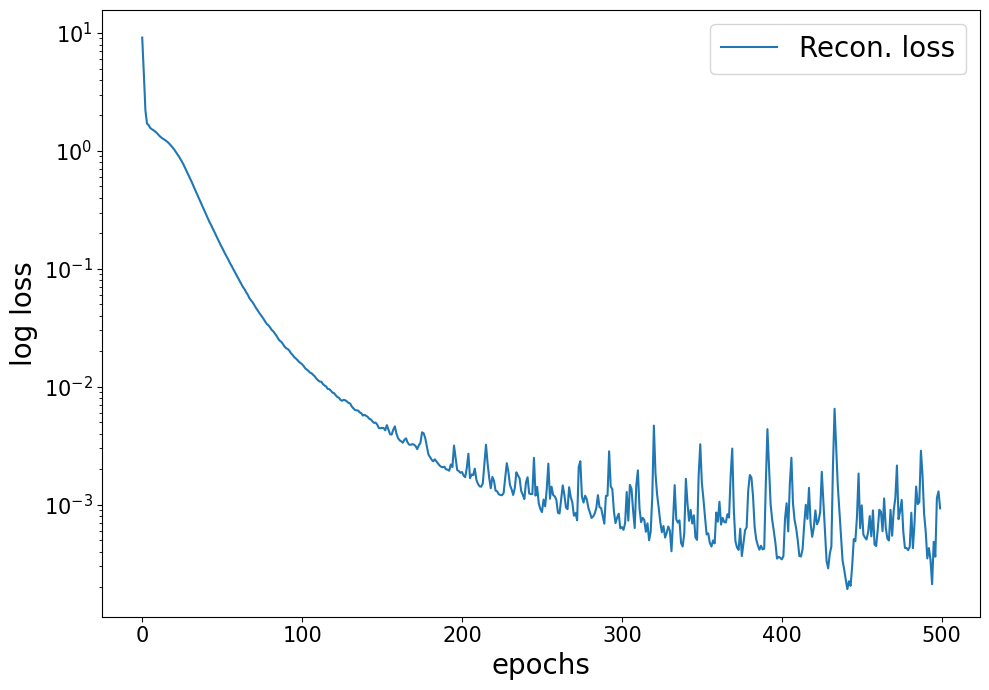

In [4]:
model = AutoEncoder(input_dim=len(hvg_genes), hidden_dim=1000, enc_layers=2, non_linearity=nn.LeakyReLU())
loss_plot = train(model, model_path=f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e500_b128_hvg.pt',
                  gene_matrix=expression[hvg_genes].values, num_epochs=500, device='cuda:2',
                  n_genes=len(hvg_genes), batch_size=128, lr=1e-4, training_seed=88232)

epoch: 500; recon: 0.495309316449695; : 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:08<00:00, 58.51it/s]


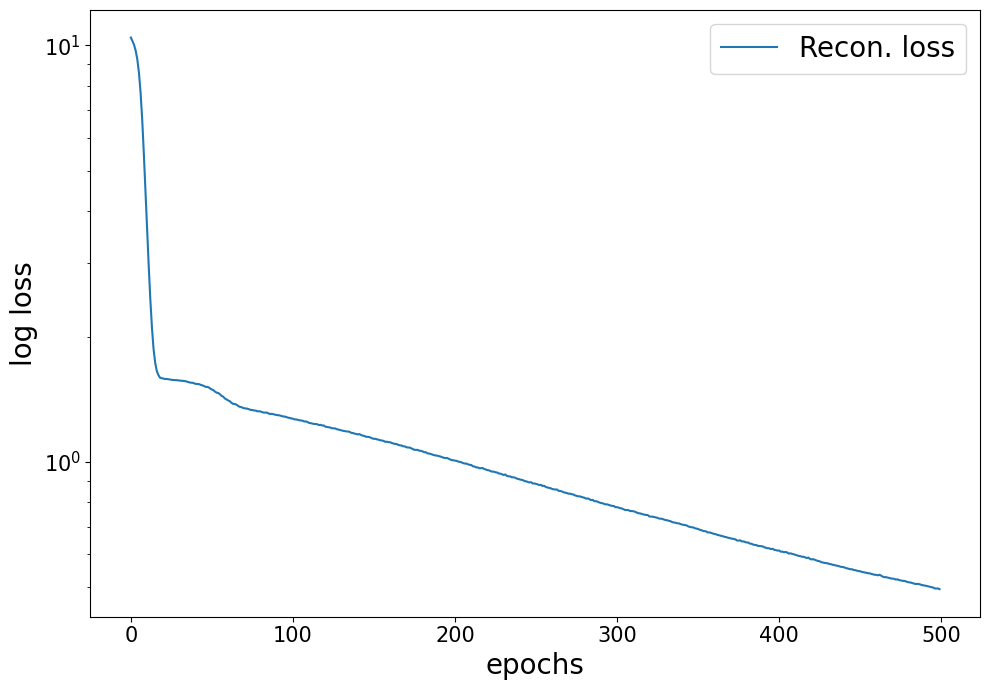

In [5]:
model = AutoEncoder(input_dim=len(hvg_genes), hidden_dim=100, enc_layers=2, non_linearity=nn.LeakyReLU())
loss_plot = train(model, model_path=f'{results_path}/ae/{name}_AELR-2-100_lr1em4_e500_b128_hvg.pt',
                  gene_matrix=expression[hvg_genes].values, num_epochs=500, device='cuda:2',
                  n_genes=len(hvg_genes), batch_size=128, lr=1e-4, training_seed=88232)

epoch: 500; recon: 0.003512346211614; : 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:10<00:00, 47.96it/s]


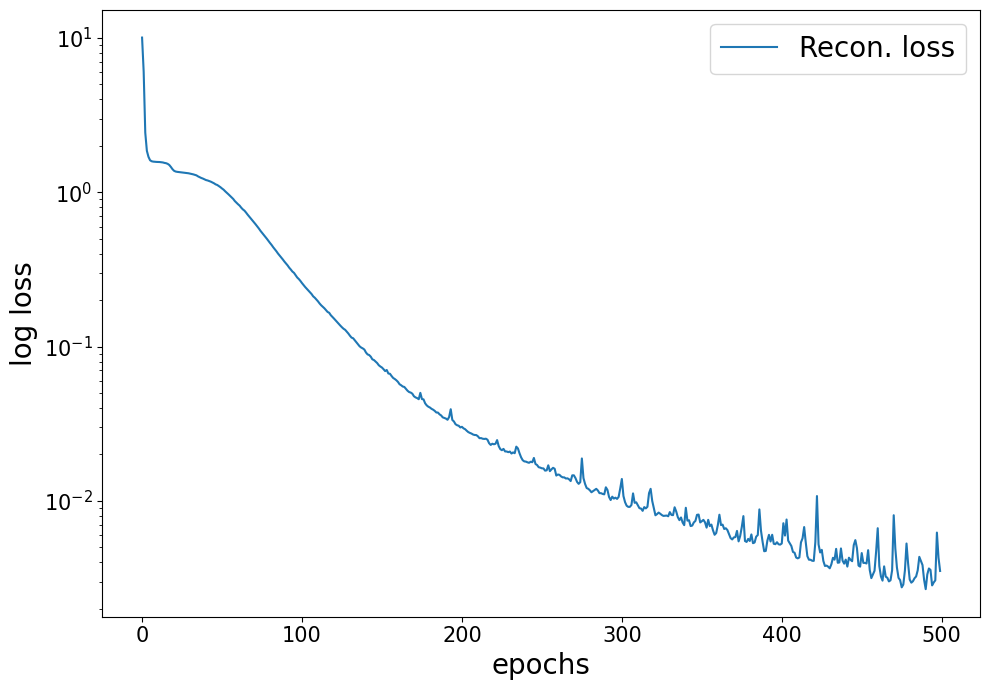

In [6]:
model = AutoEncoder(input_dim=len(hvg_genes), hidden_dim=1000, enc_layers=3, non_linearity=nn.LeakyReLU())
loss_plot = train(model, model_path=f'{results_path}/ae/{name}_AELR-3-1000_lr1em4_e500_b128_hvg.pt',
                  gene_matrix=expression[hvg_genes].values, num_epochs=500, device='cuda:2',
                  n_genes=len(hvg_genes), batch_size=128, lr=1e-4, training_seed=88232)

loading model from path ./results/ae/3435_NT_T1_AELR-2-1000_lr1em4_e500_b128_hvg.pt
done loading model from path
Pre-trained recon. loss is 0.0006601489731110632


epoch: 101; recon: 0.027307225391269; trip: 0.5649869441986; total: 0.592294156551361; :   5%|████▎                                                                                | 101/2000 [00:19<06:17,  5.03it/s]

Saved model at ./results/ae/3435_NT_T1_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e100.pt


epoch: 251; recon: 0.023471379652619; trip: 0.2193176895380; total: 0.242789074778557; :  13%|██████████▋                                                                          | 251/2000 [00:48<05:45,  5.06it/s]

Saved model at ./results/ae/3435_NT_T1_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e250.pt


epoch: 501; recon: 0.011628265492618; trip: 0.0482117608190; total: 0.059840027242899; :  25%|█████████████████████▎                                                               | 501/2000 [01:37<04:57,  5.04it/s]

Saved model at ./results/ae/3435_NT_T1_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e500.pt


epoch: 2000; recon: 0.001405802904628; trip: 0.0002797993657; total: 0.001685602241196; : 100%|███████████████████████████████████████████████████████████████████████████████████| 2000/2000 [06:34<00:00,  5.07it/s]


Saved model at ./results/ae/3435_NT_T1_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e2000.pt
Evaluating model ...
Total rec loss: 0.0016327257035300136
Total trip loss: 0.0005518581601791084


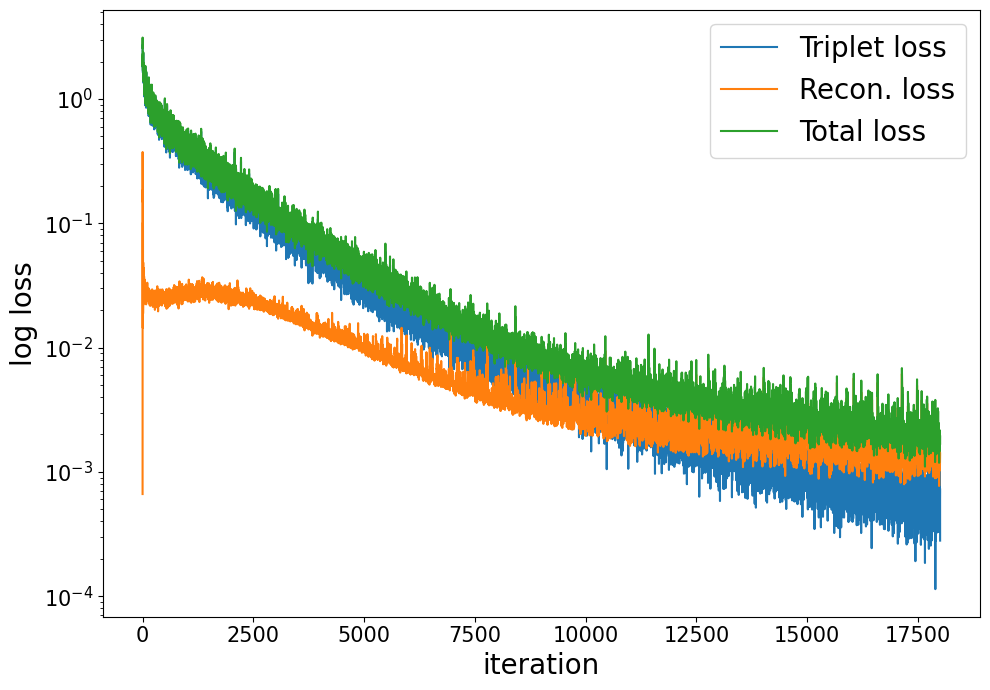

In [7]:
# train AE for 2000 epochs with triplet loss
_ = train_triplet(model=None, model_path=f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg.pt',
                  training_seed=12345, n_genes=len(hvg_genes), h=1, gene_matrix=expression[hvg_genes].values,
                  apn_lut_path=lut_path, display=True, num_epochs=2000, device='cuda:7', batch_size=128,
                  lr=1e-4, init_path=f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e500_b128_hvg.pt',
                  save_epochs=[100, 250, 500, 2000])

# Figure 1

## Trees and t-SNE

In [19]:
def get_features(model, genes, device):
  model.to(device).eval()
  with torch.no_grad():
    _, x_z = model.forward(torch.from_numpy(genes).float().to(device), return_z=True)
  return x_z.cpu().numpy()

In [21]:
np.random.seed(123121)
gene_tsne = get_tsne(expression[hvg_genes].values)
learnt_tsne = get_tsne(get_features(
    torch.load(f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e2000.pt',
               map_location=torch.device('cuda:0')),
    expression[hvg_genes].values, 'cuda:0'))

/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [22]:
_, top_down_clusters = get_top_down_cluster_ids(tree_path, labels_in_order, depth=1)
node_data, edge_data = get_node_and_edge_data(tree_path)
interactive_plot(node_data, edge_data, labels_in_order,
                 [cell_types.loc[labels_in_order]['type'].values.tolist(), top_down_clusters],
                 ['cell types', 'top_down_clusters'],
                 [gene_tsne, learnt_tsne],
                 ['TSNE of preprocessed gene expression', 'TSNE of learnt features gene expression'],
                 line_width=2
                 ).configure_legend(orient='bottom', direction='horizontal')

alt.HConcatChart(...)

## Example edge weight optimization

epoch: 1000; score: 4.106586239698252; : 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 570.63it/s]


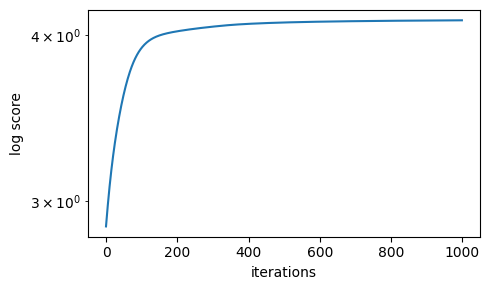

In [12]:
# simulate half tree BMTM and half tree random noise
small_tree_path = f'{data_path}/preprocessed/d5tree.nwk'
d5tree = Tree(make_binary_tree(height=5), format=1)
d5tree.write(outfile=small_tree_path, format=1)
d5left, d5right = d5tree.get_children()
d5bmtm20 = generate_bmtm_data_from_tree(d5left, dim=20, sigma=1)
d5less20 = pd.concat([d5bmtm20, generate_noise_data_from_tree(d5right, dim=20, sigma=1,  seed=234856)])
small_norm_expression = ((d5less20 - d5less20.mean(axis=0))/d5less20.std(axis=0))

# optimize gene and edge weights
model = TreeGeneModel(small_tree_path, small_norm_expression.index,
                      skip_tip_distance=-1, gene_dim=len(small_norm_expression.columns))
loss_fig = optimize_weights(model, small_norm_expression.values, lr=1e-2, epochs=1000)
ew_df = pd.DataFrame(torch.exp(model.log_edge_weights.detach()).cpu().numpy(), index=model.edges_ends, columns=['weight'])
loss_fig.show()

In [13]:
# plot unoptimized tree
etree = augment_tree_with_weights(small_tree_path, 1 + 0 * ew_df['weight'])
etree.write(outfile=f'{data_path}/temp.nwk', format=1)
node_data, edge_data = get_node_and_edge_data(f'{data_path}/temp.nwk')
node_data.loc[0, 'cell_label'] = 'N0000'

inner_names = list(set(ew_df.index) - set(small_norm_expression.index))
node_labels = np.concatenate([small_norm_expression.index.values, inner_names])
single_tree_plot(node_data, edge_data, cell_labels=node_labels.tolist(),
          colors=[np.concatenate([small_norm_expression[c], NAN_COLOR_VALUE * np.ones(len(inner_names))]) for c in small_norm_expression.columns],
          color_names=small_norm_expression.columns.values.tolist(), nan_smaller=True,
          tooltip_names=['cell_label'], show_legend=True, continuous_colors=True, node_size=100, width=300, line_width=2)

alt.LayerChart(...)

In [14]:
# plot resulting tree
etree = augment_tree_with_weights(small_tree_path, ew_df['weight'])
etree.write(outfile=f'{data_path}/temp.nwk', format=1)
node_data, edge_data = get_node_and_edge_data(f'{data_path}/temp.nwk')
node_data.loc[0, 'cell_label'] = 'N0000'

inner_names = list(set(ew_df.index) - set(small_norm_expression.index))
node_labels = np.concatenate([small_norm_expression.index.values, inner_names])
single_tree_plot(node_data, edge_data, cell_labels=node_labels.tolist(),
          colors=[np.concatenate([small_norm_expression[c], NAN_COLOR_VALUE * np.ones(len(inner_names))]) for c in small_norm_expression.columns] + [ew_df.loc[node_labels, 'weight']],
          color_names=small_norm_expression.columns.values.tolist() + ['incoming edge weight'], nan_smaller=True,
          tooltip_names=['cell_label'], show_legend=True, continuous_colors=True, node_size=100, width=300, line_width=2)

alt.LayerChart(...)

# Figure S1

Reuses t-SNE computed for Fig. 1.

## Visualize data and representations

In [15]:
_, top_down_clusters = get_top_down_cluster_ids(tree_path, labels_in_order, depth=1)

color_df2 = pd.DataFrame(index=kp_color_domain)
color_df2['color'] = nice_colors
color_df2 = color_df2.loc[np.unique(top_down_clusters)]

cell_types_array = cell_types.loc[labels_in_order]['type'].values
features = get_features(torch.load(f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e2000.pt',
               map_location=torch.device('cuda:0')),
                        expression[hvg_genes].values, 'cuda:0')

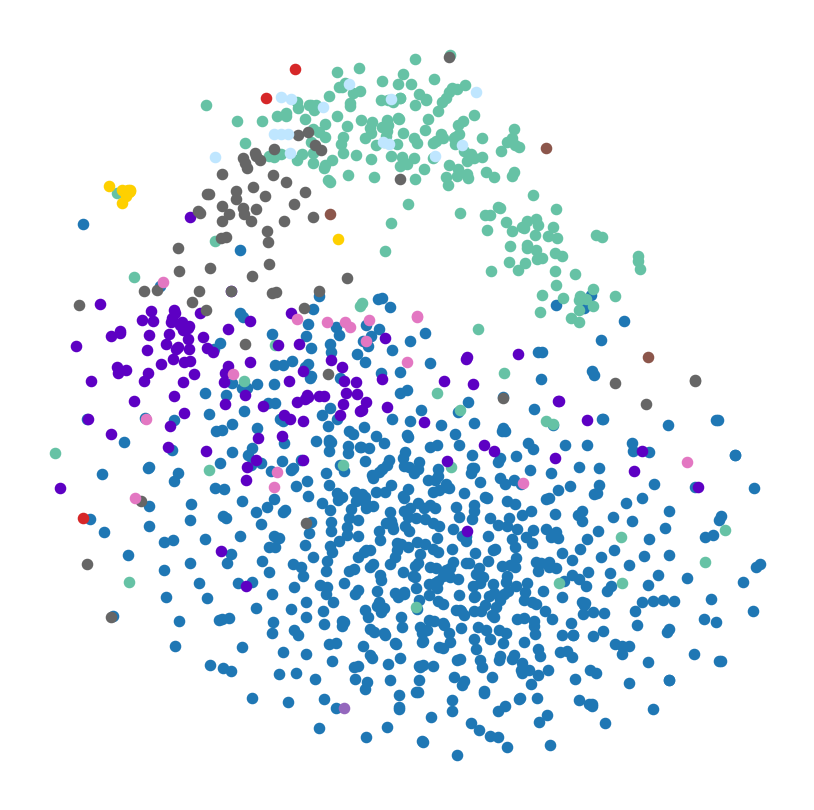

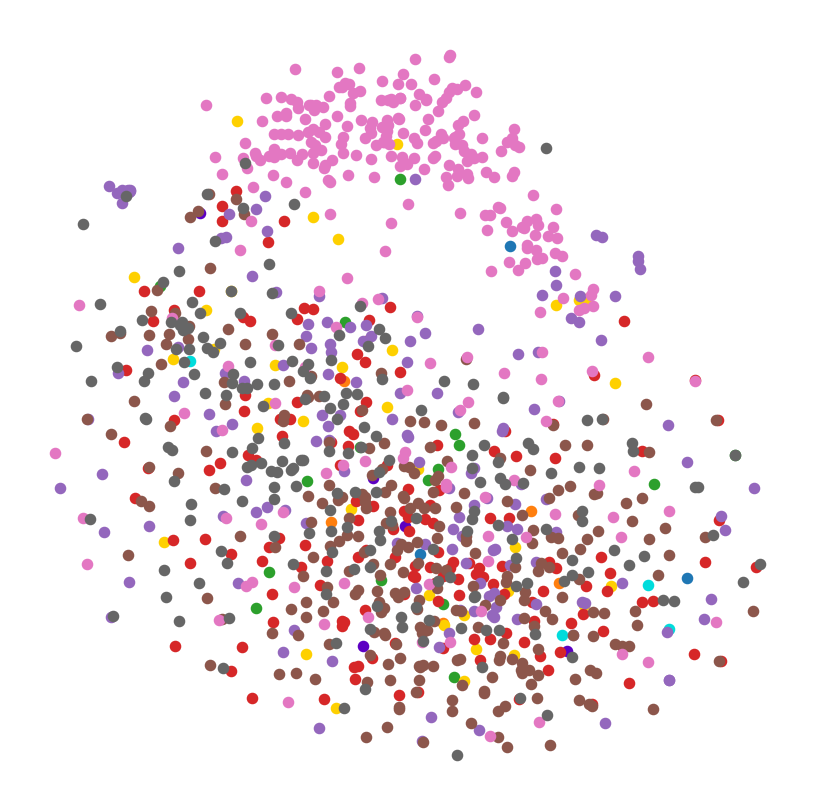

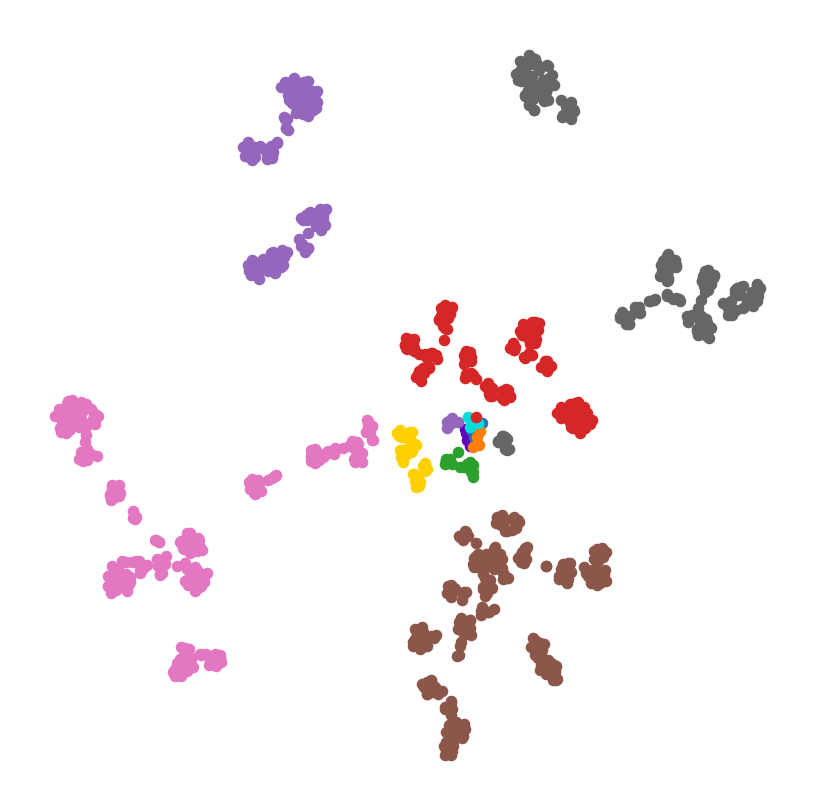

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df.itertuples():
  ax.scatter(x=gene_tsne[cell_types_array == t, 0], y=gene_tsne[cell_types_array == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=gene_tsne[top_down_clusters == t, 0], y=gene_tsne[top_down_clusters == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=learnt_tsne[top_down_clusters == t, 0], y=learnt_tsne[top_down_clusters == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

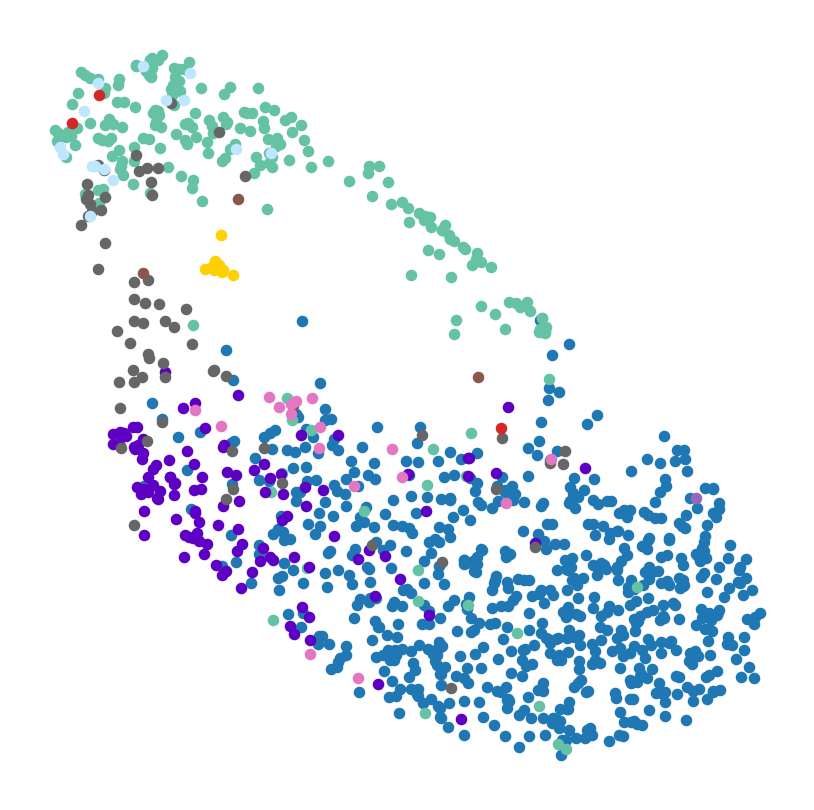

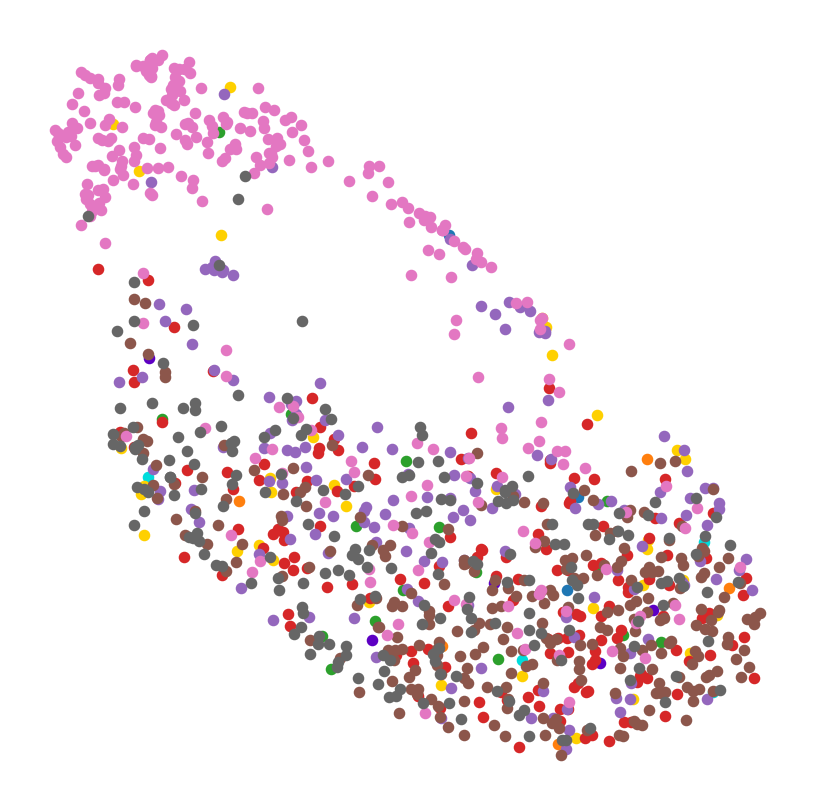

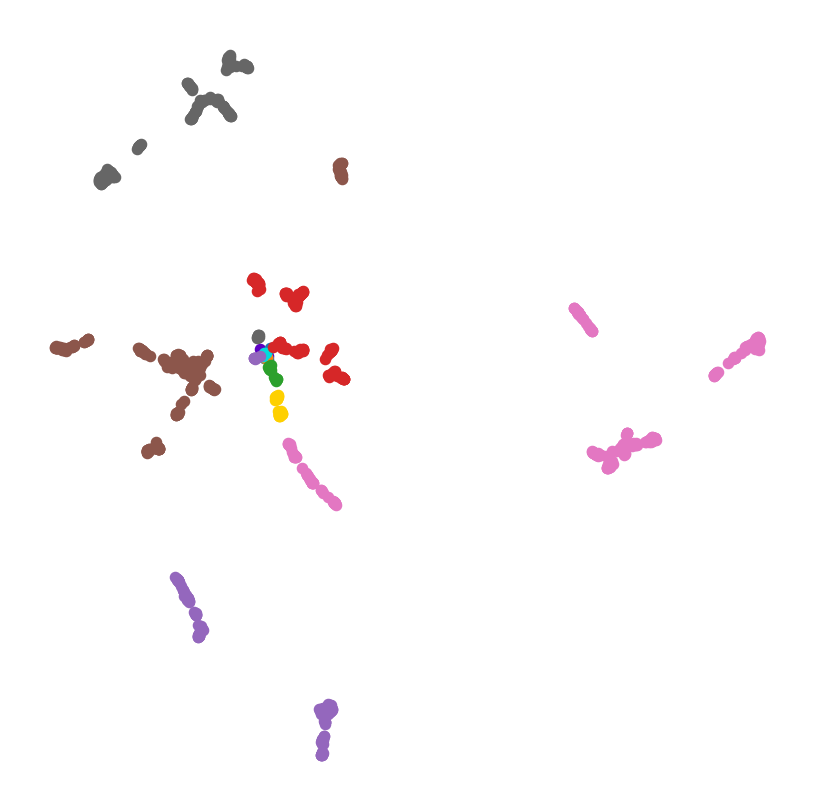

In [17]:
def get_umap(features):
  return umap.UMAP().fit_transform(features)

np.random.seed(123121)
gene_umap = get_umap(expression[hvg_genes].values)
learnt_umap = get_umap(features)

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df.itertuples():
  ax.scatter(x=gene_umap[cell_types_array == t, 0], y=gene_umap[cell_types_array == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=gene_umap[top_down_clusters == t, 0], y=gene_umap[top_down_clusters == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=learnt_umap[top_down_clusters == t, 0], y=learnt_umap[top_down_clusters == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

In [18]:
def get_pca2(features):
  return PCA(n_components=2).fit_transform(features)

np.random.seed(123121)
gene_pca = get_pca2(expression[hvg_genes].values)
learnt_pca = get_pca2(features)

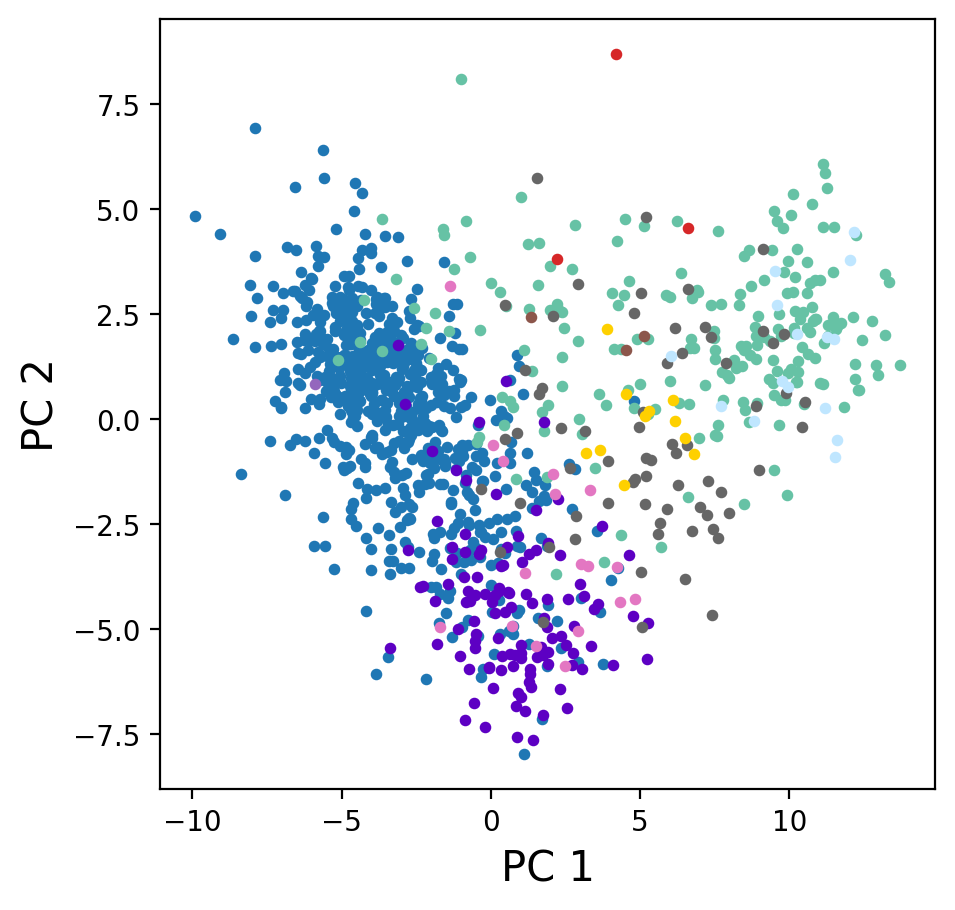

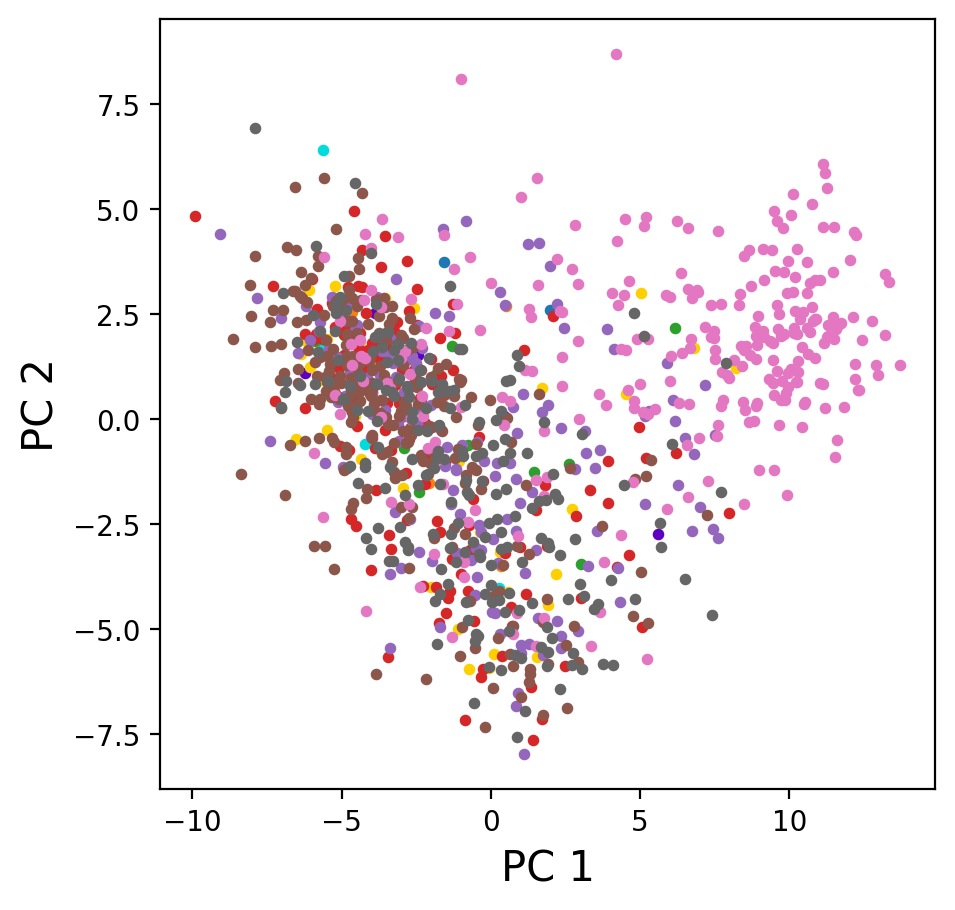

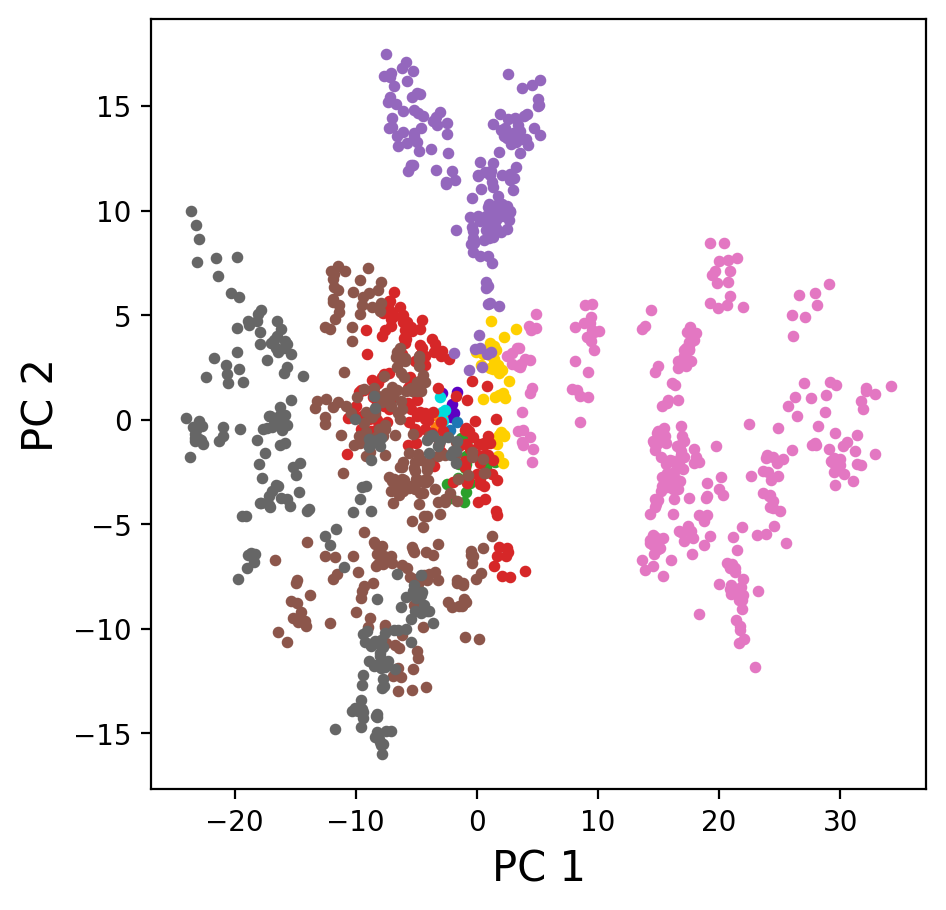

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df.itertuples():
  ax.scatter(x=gene_pca[cell_types_array == t, 0], y=gene_pca[cell_types_array == t, 1], color=c, s=10)
ax.set_xlabel('PC 1', fontsize=15)
ax.set_ylabel('PC 2', fontsize=15)
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=gene_pca[top_down_clusters == t, 0], y=gene_pca[top_down_clusters == t, 1], color=c, s=10)
ax.set_xlabel('PC 1', fontsize=15)
ax.set_ylabel('PC 2', fontsize=15)
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=learnt_pca[top_down_clusters == t, 0], y=learnt_pca[top_down_clusters == t, 1], color=c, s=10)
ax.set_xlabel('PC 1', fontsize=15)
ax.set_ylabel('PC 2', fontsize=15)
fig.show()

In [20]:
# local copy of https://github.com/facebookresearch/PoincareMaps
from PoincareMaps.main import compute_poincare_maps

def get_poincare(features, labels):
  features = torch.from_numpy(features)
  poincare_coord, _ = compute_poincare_maps(
      features, labels, 'example', mode='features', k_neighbours=15,
      distlocal='minkowski', sigma=1.0, gamma=2.0, color_dict=None, epochs=500,
      batchsize=-1, lr=0.1, earlystop=0.0001, cuda=True)
  return poincare_coord

np.random.seed(123121)
gene_poincare = get_poincare(expression[hvg_genes].values, labels_in_order)
pd.DataFrame(gene_poincare).to_csv(f'{results_path}/vis/{name}_hvg_poincare.csv', header=False, index=False)
learnt_poincare = get_poincare(features, labels_in_order)
pd.DataFrame(learnt_poincare).to_csv(f'{results_path}/vis/{name}_ae_poincare.csv', header=False, index=False)

Computing laplacian...
Laplacian computed in 0.08 sec
Computing RFA...
RFA computed in 0.05 sec
batchsize =  111
Starting training...


loss: 0.26689: 100%|██████████████████████████| 500/500 [00:13<00:00, 36.10it/s]


PM computed in 13.85 sec
loss = 2.669e-01
time = 0.233 min
Computing laplacian...
Laplacian computed in 0.10 sec
Computing RFA...
RFA computed in 0.09 sec
batchsize =  111
Starting training...


loss: 0.43424: 100%|██████████████████████████| 500/500 [00:13<00:00, 38.04it/s]


PM computed in 13.14 sec
loss = 4.342e-01
time = 0.221 min


In [21]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
%matplotlib inline

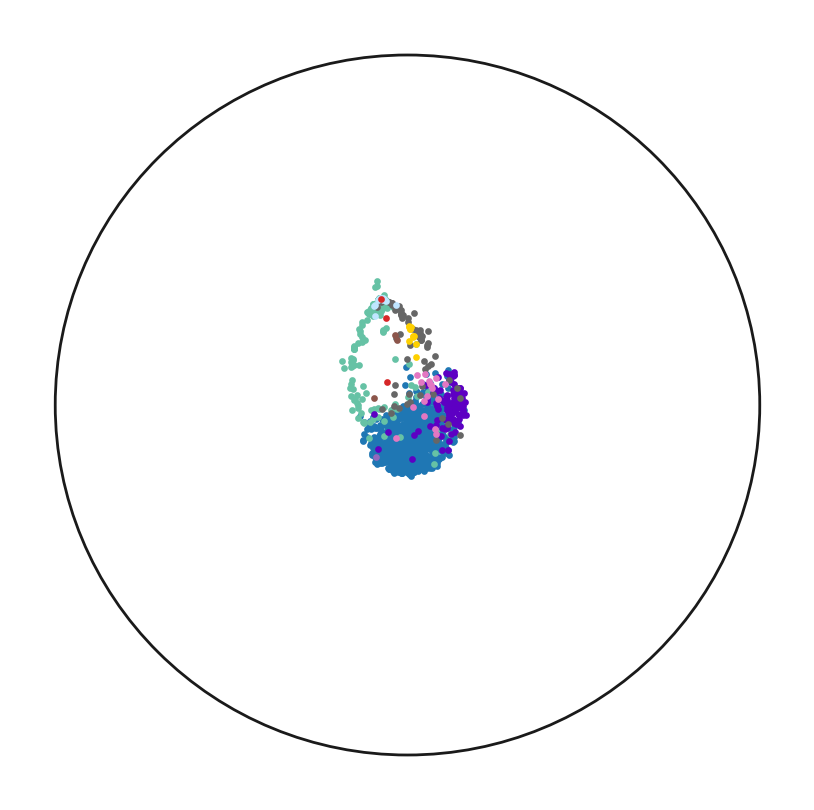

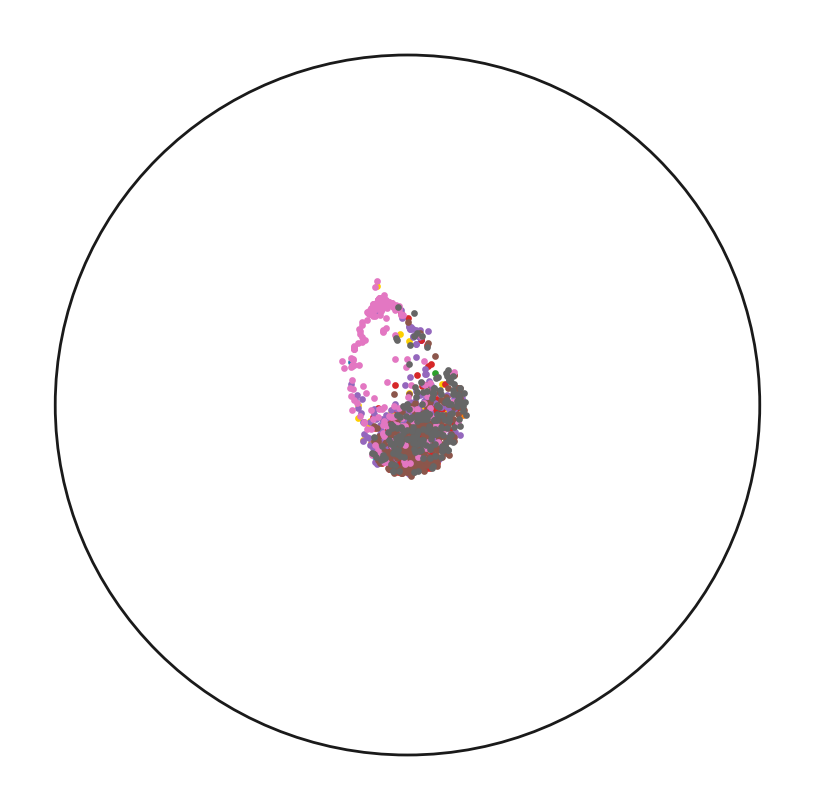

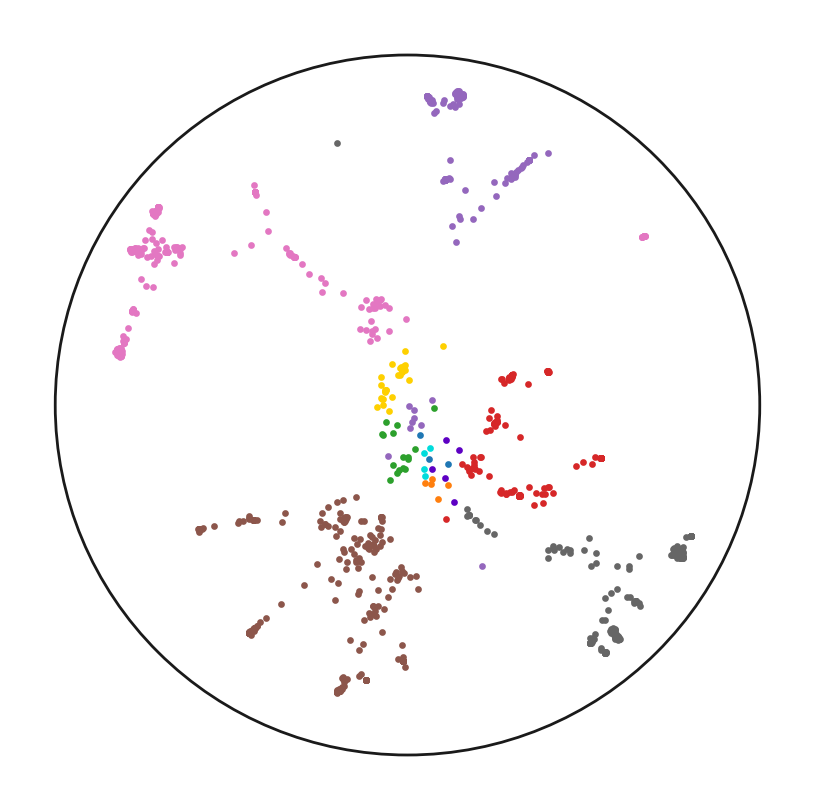

In [22]:
gene_poincare = pd.read_csv(f'{results_path}/vis/{name}_hvg_poincare.csv', header=None).values
learnt_poincare = pd.read_csv(f'{results_path}/vis/{name}_ae_poincare.csv', header=None).values

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df.itertuples():
  ax.scatter(x=gene_poincare[cell_types_array == t, 0], y=gene_poincare[cell_types_array == t, 1], color=c, s=2)

circle = plt.Circle((0, 0), 1, color='k', fill=False)
ax.add_patch(circle)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=gene_poincare[top_down_clusters == t, 0], y=gene_poincare[top_down_clusters == t, 1], color=c, s=2)

circle = plt.Circle((0, 0), 1, color='k', fill=False)
ax.add_patch(circle)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=learnt_poincare[top_down_clusters == t, 0], y=learnt_poincare[top_down_clusters == t, 1], color=c, s=2)

circle = plt.Circle((0, 0), 1, color='k', fill=False)
ax.add_patch(circle)
ax.axis('off')
fig.show()

## Histograms of HVG counts

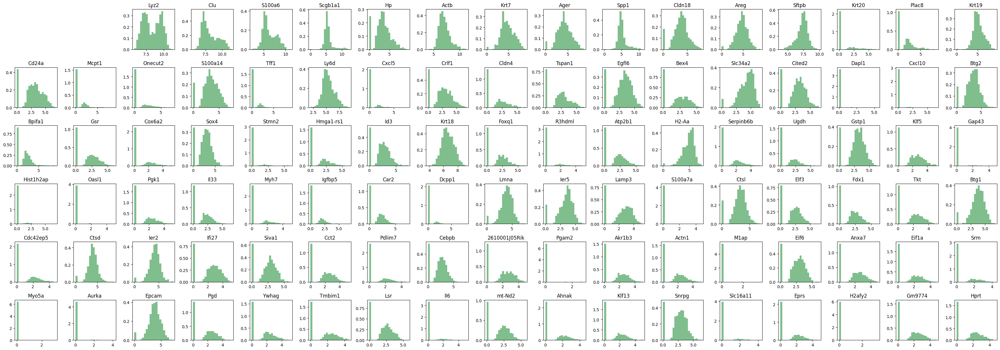

In [23]:
fig, axs = plt.subplots(6, 17, figsize=(34, 12))
for i, ax in enumerate(axs.flatten()[2:]):
  ax.hist(expression[hvg_genes[i]].values, 20, density=True, facecolor='g', alpha=0.75)
  ax.set_title(hvg_genes[i])
axs[0,0].axis('off')
axs[0,1].axis('off')
fig.tight_layout()
fig.show()

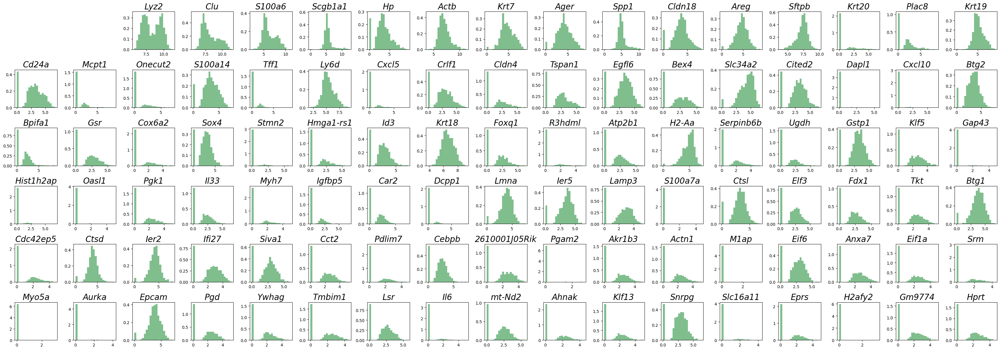

In [25]:
fig, axs = plt.subplots(6, 17, figsize=(34, 12))
for i, ax in enumerate(axs.flatten()[2:]):
  ax.hist(expression[hvg_genes[i]].values, 20, density=True, facecolor='g', alpha=0.75)
  ax.set_title(hvg_genes[i], style='italic', size=20)
axs[0,0].axis('off')
axs[0,1].axis('off')
fig.tight_layout()
fig.show()

# Figure S2

## AE results

In [21]:
def aggregate_losses(name, n_genes, max_height, gene_subset_name,
                     max_epoch=100, stops=[1, 3, 8, 15, 30, 50, 100],
                     training_seeds=[112221, 99483, 92231, 6243321, 555242],
                     perm_seeds=[12345, 66689, 41382, 3838374, 12311],
                     types_fixed=True, model_kind='AELR-2-1000', h=1):
  df = pd.DataFrame()
  batches_per_epoch = 0
  type_str = 'type' if types_fixed else ''
  for training_seed in training_seeds:
    for perm_seed in perm_seeds:
      # without permutation (d=0) only need one model per training seed
      for d in range(0 if perm_seed == perm_seeds[0] else 1, max_height+1):
        h_str = f'{h:0.2f}'.replace('.', 'p') if int(h) != h else str(h)
        loss_path = f'{results_path}/ae/{name}_{model_kind}_lr1em4_e{max_epoch}_b128_h{h_str}_pd_pre_ts{training_seed}_perm{perm_seed}d{d}{type_str}_g{n_genes}{gene_subset_name}_loss.csv'
        try:
          dfi = pd.read_csv(loss_path)
        except FileNotFoundError as e:
          print(e)
          continue
        except EmptyDataError as e:
          print(e)
          continue
        dfi['training_seed'] = training_seed
        dfi['perm_seed'] = perm_seed
        dfi['height'] = d
        dfi = dfi.rename(columns={'recon_loss': 'rec_loss'})
        df = pd.concat([df, dfi])
        batches_per_epoch = len(dfi) // max_epoch  # same for all

  if len(df) == 0:
    return None, None

  df['epoch'] = df['iter'] // batches_per_epoch + 1

  df_stops = pd.DataFrame()
  for stop in stops:
    df_epoch = df[df['epoch'] == stop].groupby(['training_seed', 'perm_seed', 'height'])[['trip_loss', 'rec_loss']].mean().reset_index()
    df_epoch['stop'] = stop
    df_stops = pd.concat([df_stops, df_epoch])

  # add epoch 0 copied from iter 0
  epoch_agg = df.groupby(['height', 'epoch', 'training_seed', 'perm_seed']).mean().reset_index()
  iter0_agg = df[df['iter'] == 0].groupby(['height', 'epoch', 'training_seed', 'perm_seed']).mean().reset_index()
  iter0_agg['epoch'] = 0
  epoch_agg = pd.concat((iter0_agg, epoch_agg))
  epoch_agg = epoch_agg.groupby(['height', 'epoch']).agg(
    rec_mean=pd.NamedAgg(column="rec_loss", aggfunc="mean"),
    rec_min=pd.NamedAgg(column="rec_loss", aggfunc="min"),
    rec_max=pd.NamedAgg(column="rec_loss", aggfunc="max"),
    trip_mean=pd.NamedAgg(column="trip_loss", aggfunc="mean"),
    trip_min=pd.NamedAgg(column="trip_loss", aggfunc="min"),
    trip_max=pd.NamedAgg(column="trip_loss", aggfunc="max"))
  epoch_agg = epoch_agg.reset_index()
  return epoch_agg, df_stops


def loss_perm_plots(name, model_kind, max_height, stops, max_epoch, n_genes=100, gene_subset_name='_hvg', h=1):
  epoch_df, stop_df = aggregate_losses(name, n_genes, max_height, gene_subset_name, max_epoch=max_epoch,
                                     stops=stops, model_kind=model_kind, h=h)
  fig, axs = plt.subplots(1, 2, figsize=(8, 2.7), dpi=300)

  num_colors = len(epoch_df['height'].unique())
  assert num_colors <= 20
  cm1 = plt.get_cmap('tab10')
  cm2 = sns.color_palette('pastel', as_cmap=True)
  colors =  [cm2[i] for i in range(num_colors - 10 - 1)] + [cm1(9 - i) for i in range(10)]
  axs[0].set_prop_cycle(color=colors)
  axs[1].set_prop_cycle(color=colors)

  for d in range(1, max_height+1, 1):
    aggd = epoch_df[(epoch_df['height'] == d)]
    axs[1].plot(aggd['epoch'], aggd['trip_mean'], label=f'{d}', lw=1)
    axs[0].plot(aggd['epoch'], aggd['rec_mean'], label=f'{d}', lw=1)

  for ax in axs[:1]:
    ax.legend(prop={'size':8}, ncol=4, title='subtree height for permutation')
  for ax in axs[1:]:
    for stop in stops:
      ax.axvline(stop, color='black', linestyle=':', lw=1)
  for ax in axs:
    ax.set_yscale('log')
    ax.tick_params(axis='both', which='both', labelsize=8)
    ax.set_xlabel('epoch', fontsize=11)

  axs[1].set_ylabel('triplet loss', fontsize=11)
  axs[0].set_ylabel('reconstruction loss', fontsize=11)
  fig.tight_layout()


  fig, axs = plt.subplots(1, 3, figsize=(8, 4), dpi=300)

  num_colors = len(epoch_df['height'].unique())
  assert num_colors <= 20
  cm1 = plt.get_cmap('tab10')
  cm2 = sns.color_palette('pastel', as_cmap=True)
  colors =  [cm2[i] for i in range(num_colors - 10 - 1)] + [cm1(9 - i) for i in range(10)]
  for ax in axs:
    ax.set_prop_cycle(color=colors)

  ranges = [(0, 30), (50, 100), (450, 500)]
  for ax, ran in zip(axs, ranges):
    for d in range(1, max_height+1, 1):
      aggd = epoch_df[(epoch_df['height'] == d) & (epoch_df['epoch'] >= ran[0]) & (epoch_df['epoch'] <= ran[1])]
      ax.plot(aggd['epoch'], aggd['trip_mean'], label=f'{d}')

  for ax in axs:
    ax.set_yscale('log')
    ax.tick_params(axis='both', which='both', labelsize=8)
    ax.set_xlabel('epoch', fontsize=11)
    ax.set_ylabel('triplet loss', fontsize=11)
  fig.tight_layout()


  fig, axs = plt.subplots(2, 3, figsize=(15, 8))

  for stop, ax2 in zip(stops, axs.flatten()):
    agg = stop_df[stop_df['stop'] == stop].groupby('height').agg(
      trip_mean=pd.NamedAgg(column="trip_loss", aggfunc="mean"),
      trip_std=pd.NamedAgg(column="trip_loss", aggfunc="std"),
      trip_med=pd.NamedAgg(column="trip_loss", aggfunc="median"),
      trip_min=pd.NamedAgg(column="trip_loss", aggfunc="min"),
      trip_max=pd.NamedAgg(column="trip_loss", aggfunc="max"))

    ax2.errorbar(agg.index, -agg['trip_mean'], yerr=agg['trip_std'], label='neg. triplet loss \nmean +/- std', color='red', fmt='--', capsize=5)
    ax2.legend(prop={'size': 16})
    ax2.set_xlabel('subtree height for permutation', fontsize=18)
    ax2.tick_params(axis='both', which='major', labelsize=12)
    ax2.set_title(f'Tree-likeness scores at epoch {stop}', fontsize=18)

    a, b = (-agg['trip_mean'] - agg['trip_std']).min(), (-agg['trip_mean'] + agg['trip_std']).max()
    ax2.set_ylim(a - 0.05 * (b - a), b + 0.05 * (b - a))
    ax2.set_xticks(agg.index.values[::4].tolist())

  fig.tight_layout()
  fig.subplots_adjust(hspace=0.4)

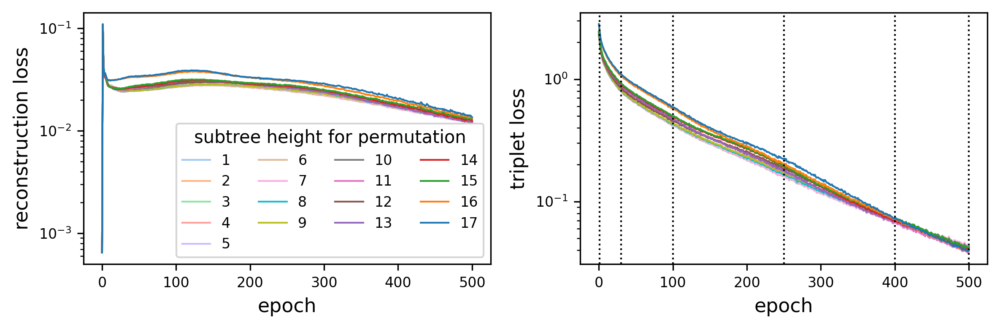

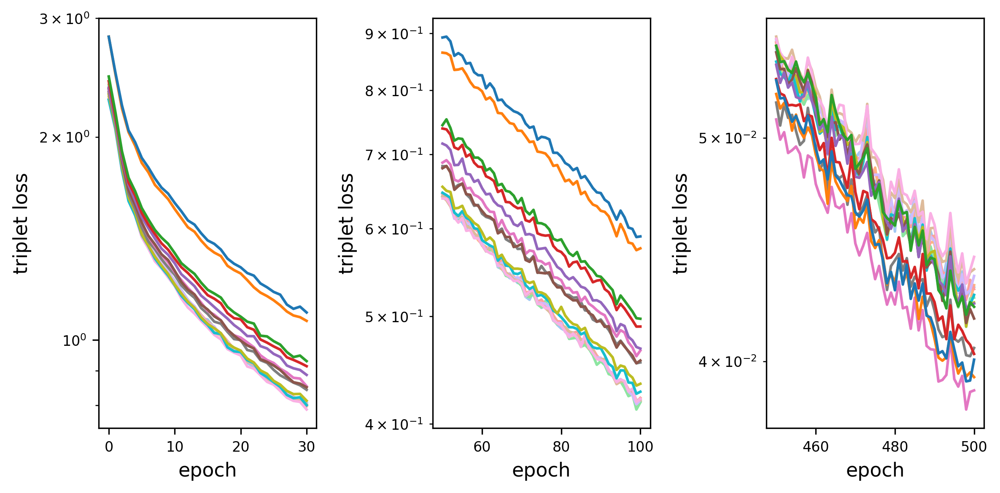

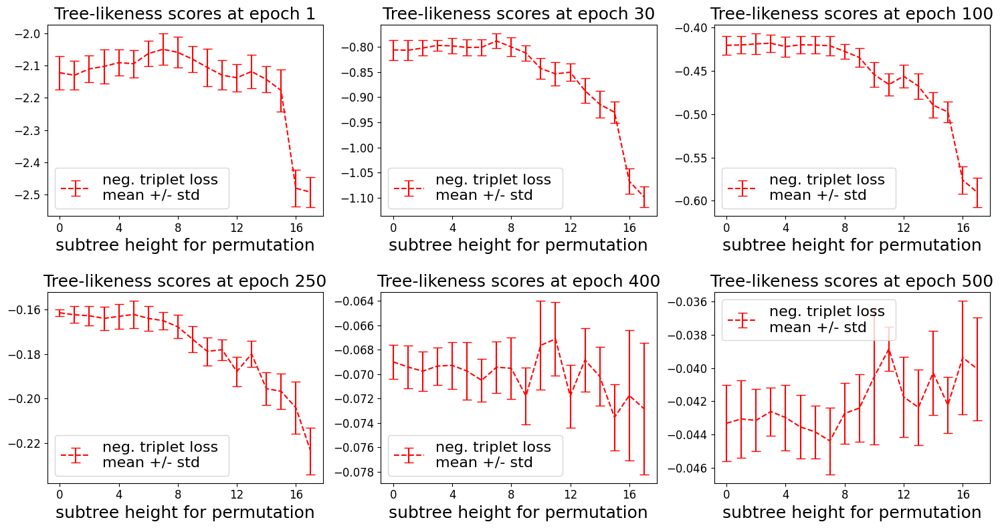

In [33]:
loss_perm_plots(name, 'AELR-2-1000', max_height=17, stops=[1, 30, 100, 250, 400, 500], max_epoch=500, gene_subset_name='_hvg')

In [23]:
epoch = 250
# select only one type
has_type = (cell_types.loc[labels_in_order] == 'AT2-like').values.flatten()

heights = [0, 4, 15, 17]
feature_tsnes = []
for height in heights:
  path = f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e500_b128_h1_pd_pre_ts112221_perm12345d{height:d}type_g100_hvg_e{epoch}.pt'

  subtrees = extract_subsets_with_height(tree_path, height=height, include_labels=labels_in_order)
  label_subsets = []
  for stree in subtrees:
    label_subsets.extend(split_by_type(stree, cell_types))

  perm_ids = get_permutation_ids(labels_in_order, label_subsets, seed=12345)
  assert (cell_types.iloc[perm_ids].values == cell_types.values).all()

  np.random.seed(123121)
  feature_tsnes.append(get_tsne(get_features(
      torch.load(path, map_location=torch.device('cuda:0')), expression[hvg_genes].values[perm_ids], 'cuda:0')[has_type],
      perplexity=15))

np.random.seed(123121)
gene_tsne_type = get_tsne(expression[has_type], perplexity=15)
interactive_plot(node_data, edge_data, labels_in_order[has_type],
                 [top_down_clusters[has_type], cell_types.loc[labels_in_order].iloc[has_type]['type'].values.tolist()],
                 ['top down tree clusters', 'cell types'],
                 [gene_tsne_type] + feature_tsnes,
                 ['Preprocessed gene expression',  f'Learnt features permuting nothing'] + [
                    f'permuting subtrees of height {height}' for height in heights[1:-1]
                 ] + ['permuting everything'], plots_per_row=3,
                 ).configure_legend(orient='bottom', direction='horizontal')

/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change

alt.VConcatChart(...)

## Tree-likeness score for cell types and permutation

In [31]:
# make data for tree likeness score by cell type plot
etree = Tree(tree_path, quoted_node_names=True, format=1)
aggs = {}
expected_lacs = {}
for t in main_types:
  subtree_labels = cell_types[cell_types['type'] == t].index.values if t != 'All' else None
  expected_lacs[t] = get_expected_lac_bmtm_height_perm(etree, expression.index, labels_subset=subtree_labels)
  aggs[t] = get_perm_dists(expression, tree_path=tree_path, subtree_labels=subtree_labels, lut_path=lut_path)

with open(f'{results_path}/scores/tumor/{name}_expected_lac.pk', 'wb') as handle:
  pickle.dump(expected_lacs, handle)
with open(f'{results_path}/scores/tumor/{name}_real_lac.pk', 'wb') as handle:
  pickle.dump(aggs, handle)

torch.Size([55101475, 3])


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:14<00:00,  1.17it/s]


torch.Size([8976776, 3])


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:06<00:00,  2.47it/s]


torch.Size([1052208, 3])


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:02<00:00,  6.86it/s]


torch.Size([55773, 3])


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00,  8.75it/s]


torch.Size([14104, 3])


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00,  9.44it/s]


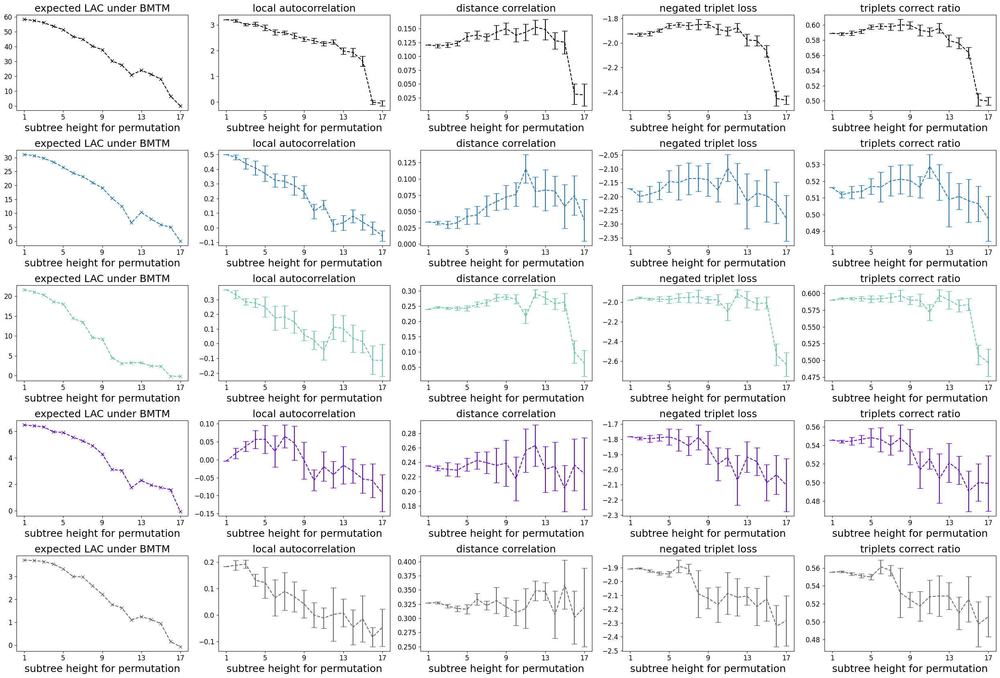

In [32]:
with open(f'{results_path}/scores/tumor/{name}_expected_lac.pk', 'rb') as handle:
  expected_lacs = pickle.load(handle)
with open(f'{results_path}/scores/tumor/{name}_real_lac.pk', 'rb') as handle:
  aggs = pickle.load(handle)

color_df.loc['All', 'color'] = '#000000'
dist_names = ['local autocorrelation', 'distance correlation', 'negated triplet loss', 'triplets correct ratio']
dist_ids = ['la', 'dc', 't', 'tc']
fig, axxs = plt.subplots(5, 5, figsize=(25, 17))
for i, t in enumerate(main_types):
  agg = aggs[t]
  expected_lac = expected_lacs[t]
  axs = axxs[i]
  for dist_name, dist_id, ax2 in zip(dist_names, dist_ids, axs.flatten()[1:]):
    ax2.errorbar(agg.index, agg[f'{dist_id}_expression_mean'], yerr=agg[f'{dist_id}_expression_std'],
                label=f'{t}', color=color_df.loc[t, 'color'], fmt='--', capsize=5)
    ax2.set_xlabel('subtree height for permutation', fontsize=18)
    ax2.tick_params(axis='both', which='major', labelsize=12)
    ax2.set_title(f'{dist_name}', fontsize=18)

    a = (agg[f'{dist_id}_expression_mean'] - agg[f'{dist_id}_expression_std']).min()
    b = (agg[f'{dist_id}_expression_mean'] + agg[f'{dist_id}_expression_std']).max()
    ax2.set_ylim(a - 0.05 * (b - a), b + 0.05 * (b - a))
    ax2.set_xticks(agg.index.values[::4].tolist())

  ax = axs[0]
  ax.plot(expected_lac['height'], expected_lac['lac'], 'x--', color=color_df.loc[t, 'color'])
  ax.set_xlabel('subtree height for permutation', fontsize=18)
  ax.tick_params(axis='both', which='major', labelsize=12)
  ax.set_title(f'expected LAC under BMTM', fontsize=18)
  ax.set_xticks(axs[1].get_xticks())
  n_cells = (cell_types['type'] == t).sum() if t != 'All' else len(cell_types)
fig.tight_layout()

# Figure S19

Uses helpers defined for Fig. S2

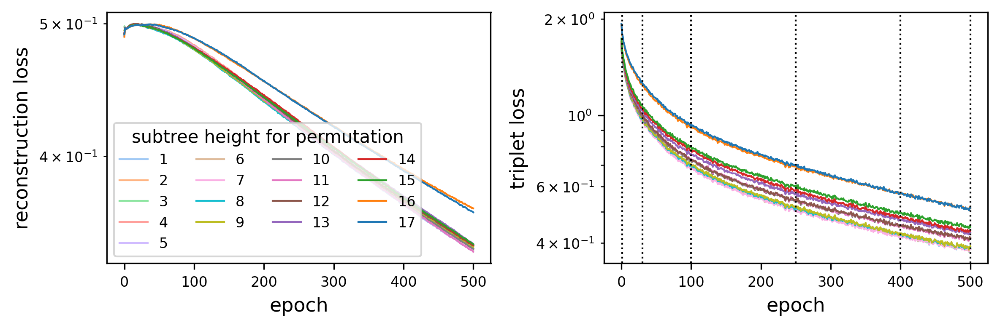

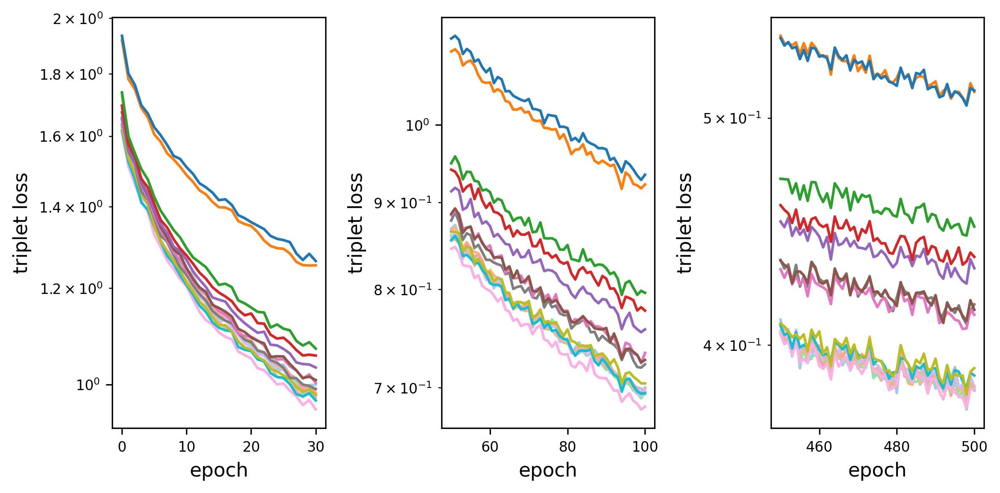

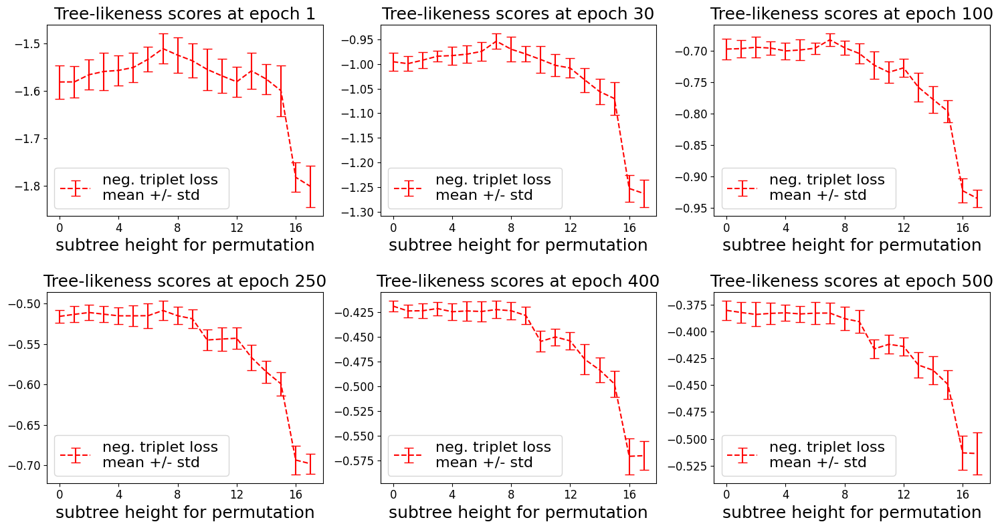

In [30]:
loss_perm_plots(name, 'AELR-2-100', max_height=17, stops=[1, 30, 100, 250, 400, 500], max_epoch=500, gene_subset_name='_hvg')

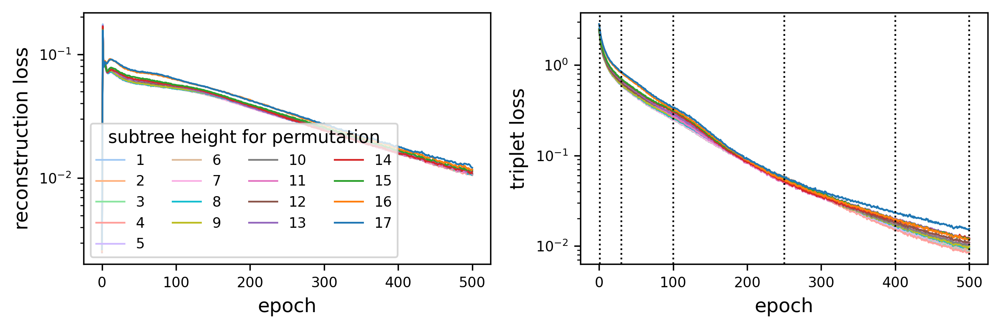

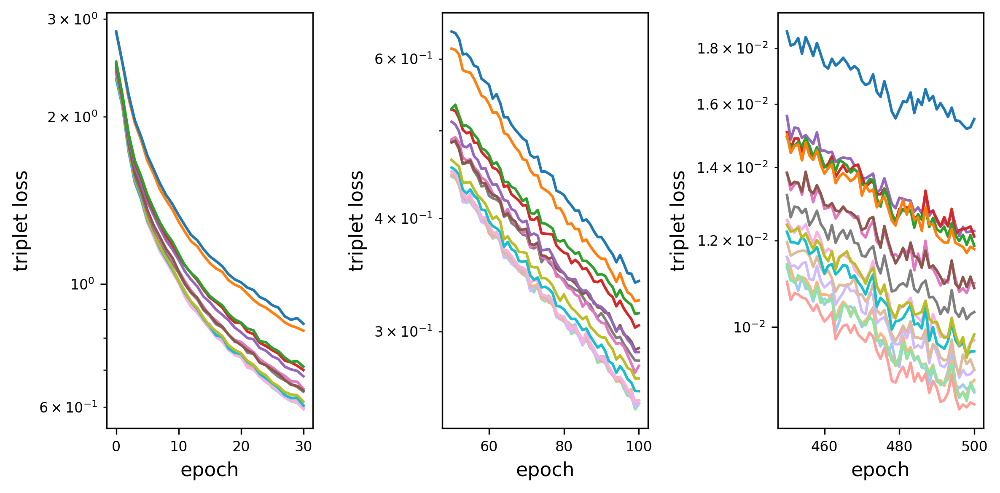

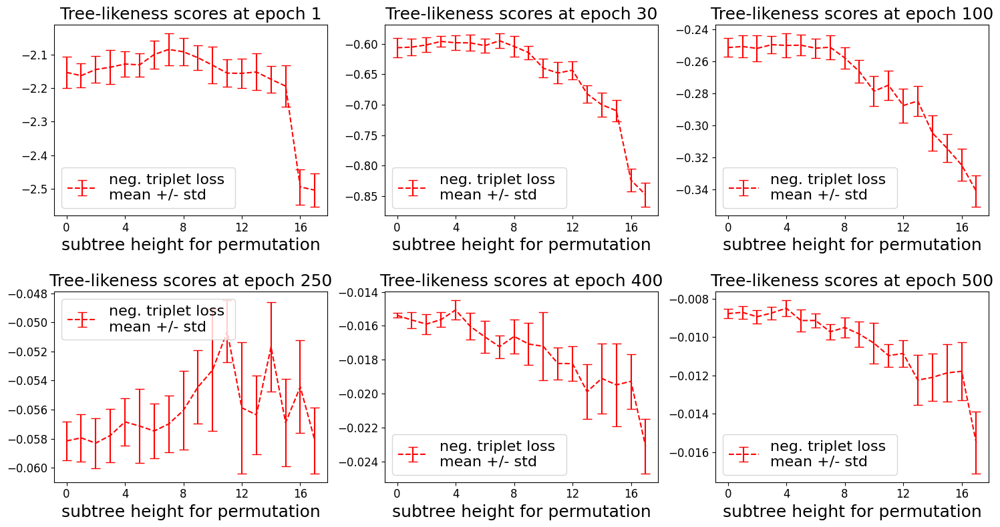

In [40]:
loss_perm_plots(name, 'AELR-3-1000', max_height=17, stops=[1, 30, 100, 250, 400, 500], max_epoch=500, gene_subset_name='_hvg')

# Figure S20

Uses helpers defined for Fig. S2

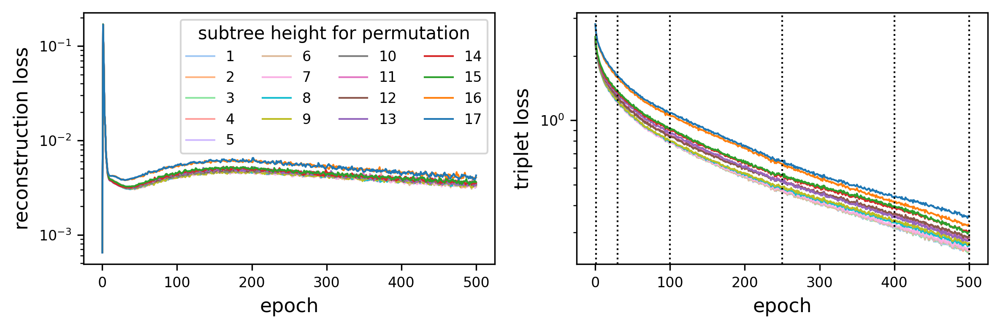

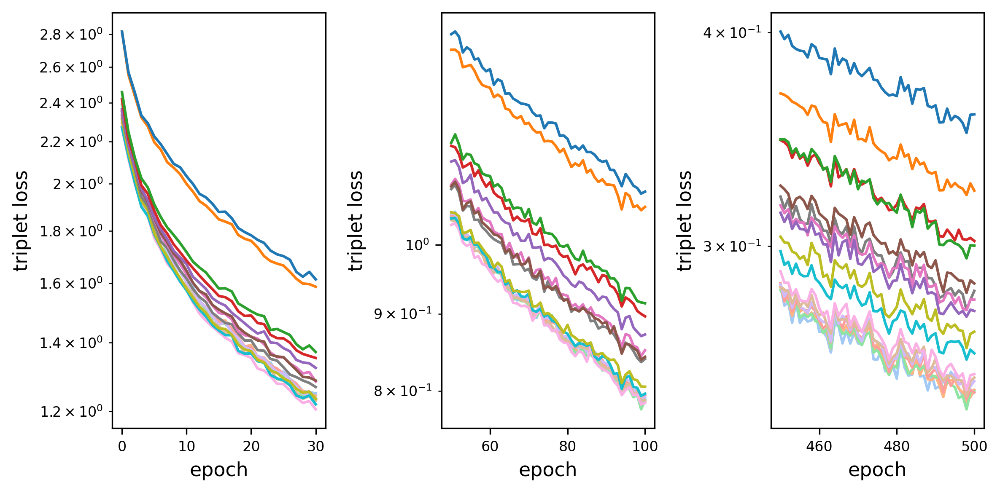

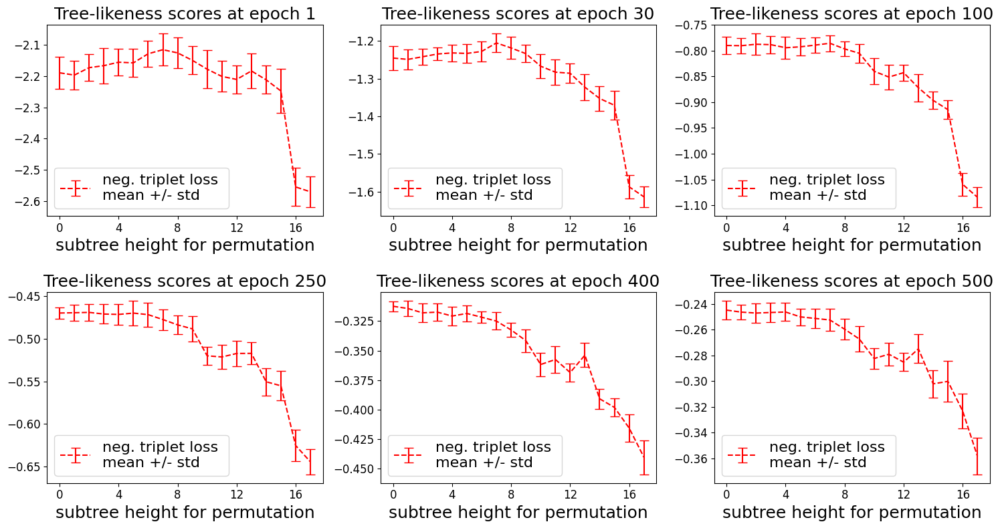

In [22]:
loss_perm_plots(name, 'AELR-2-1000', max_height=17, stops=[1, 30, 100, 250, 400, 500], max_epoch=500, gene_subset_name='_hvg', h=0.1)

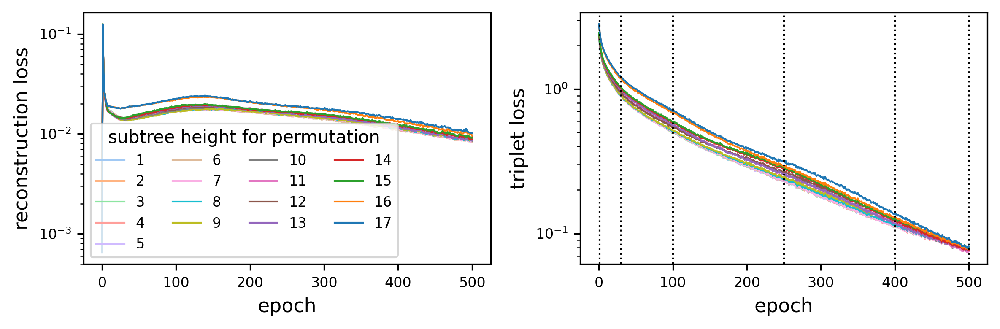

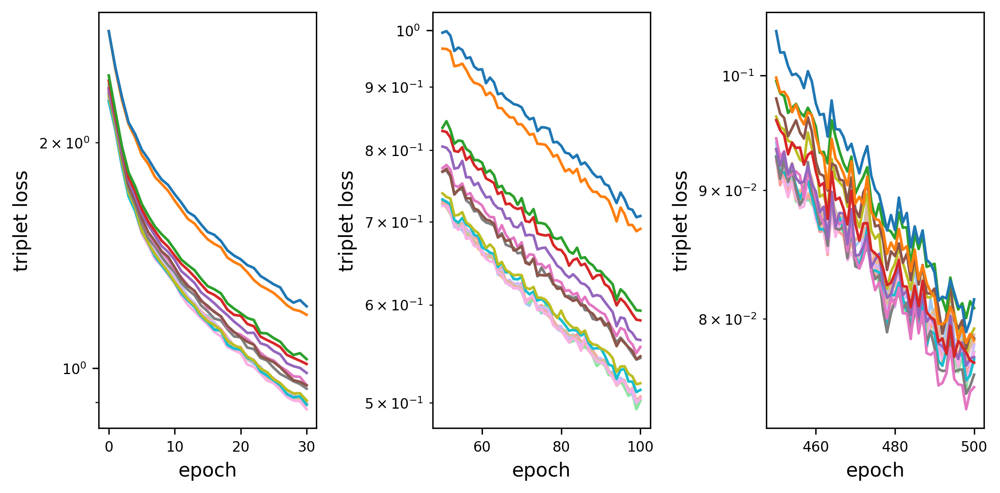

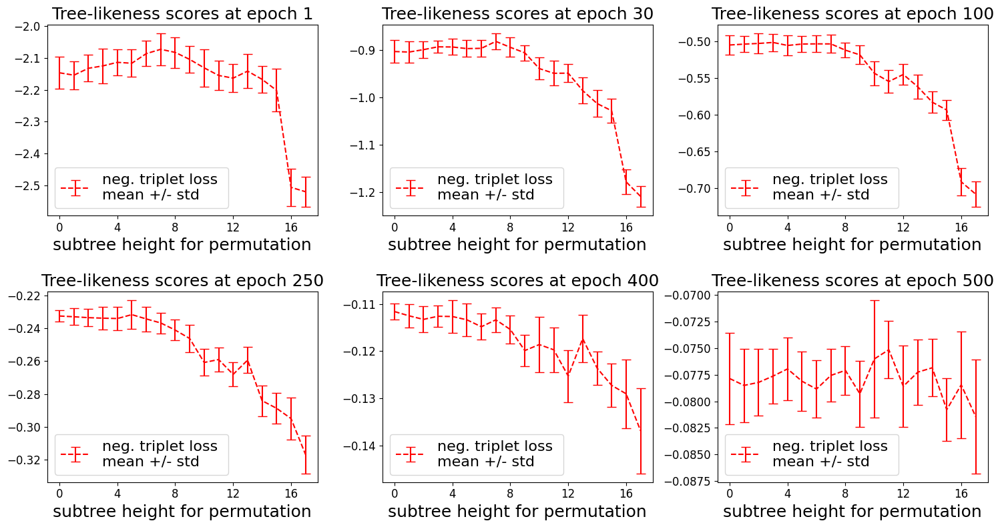

In [9]:
loss_perm_plots(name, 'AELR-2-1000', max_height=17, stops=[1, 30, 100, 250, 400, 500], max_epoch=500, gene_subset_name='_hvg', h=0.5)

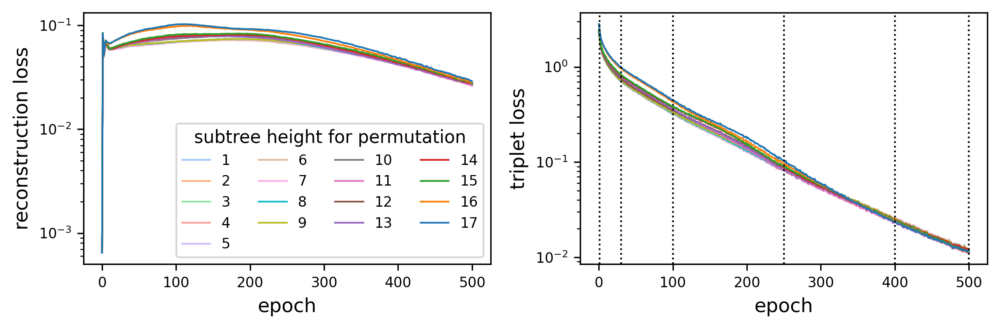

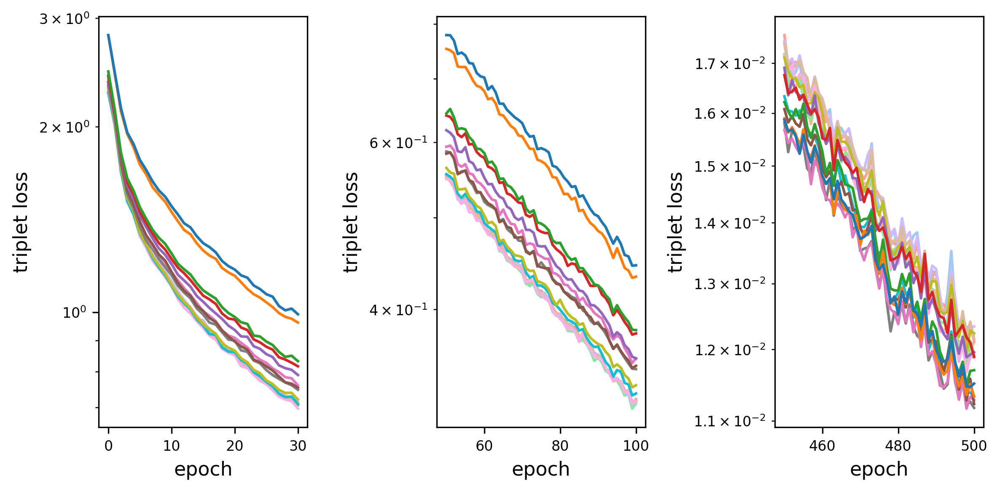

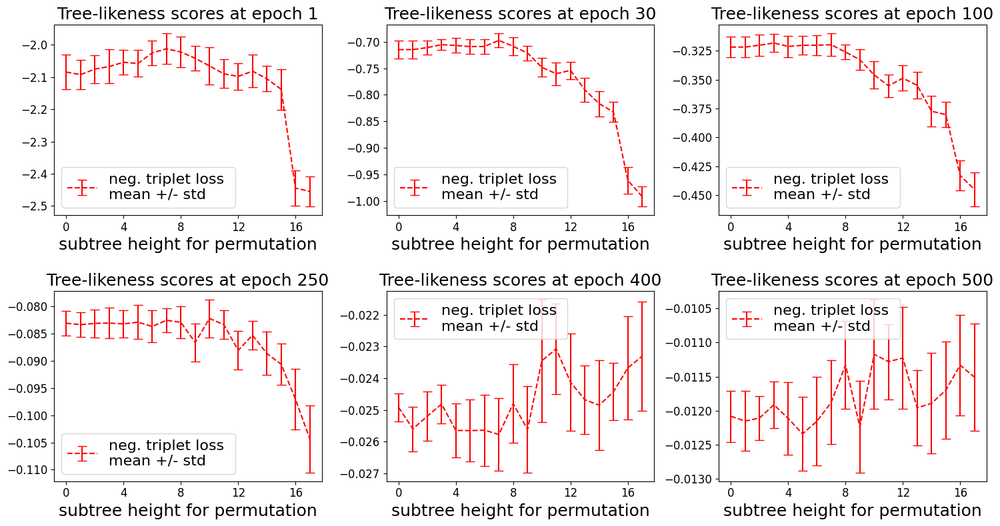

In [24]:
loss_perm_plots(name, 'AELR-2-1000', max_height=17, stops=[1, 30, 100, 250, 400, 500], max_epoch=500, gene_subset_name='_hvg', h=5)

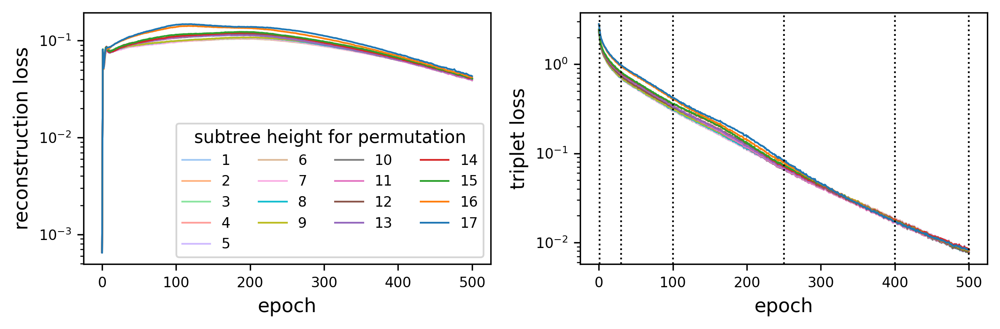

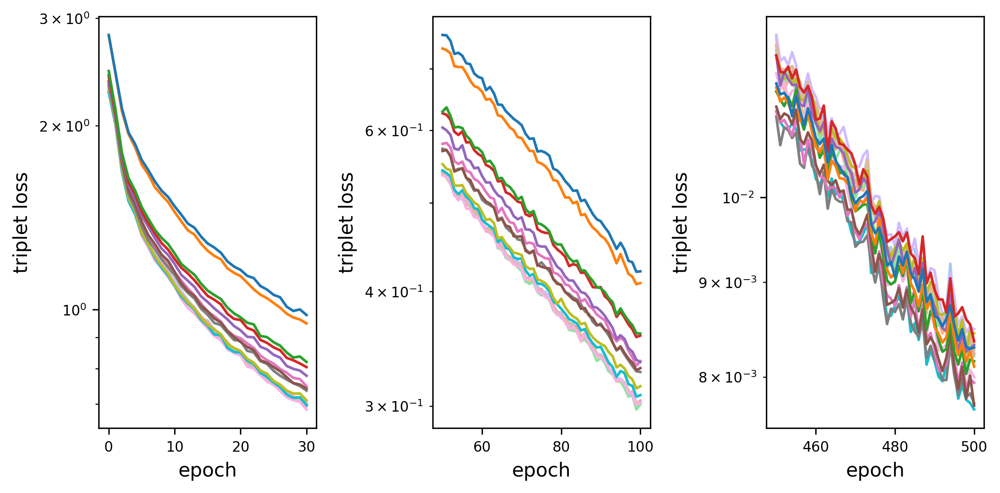

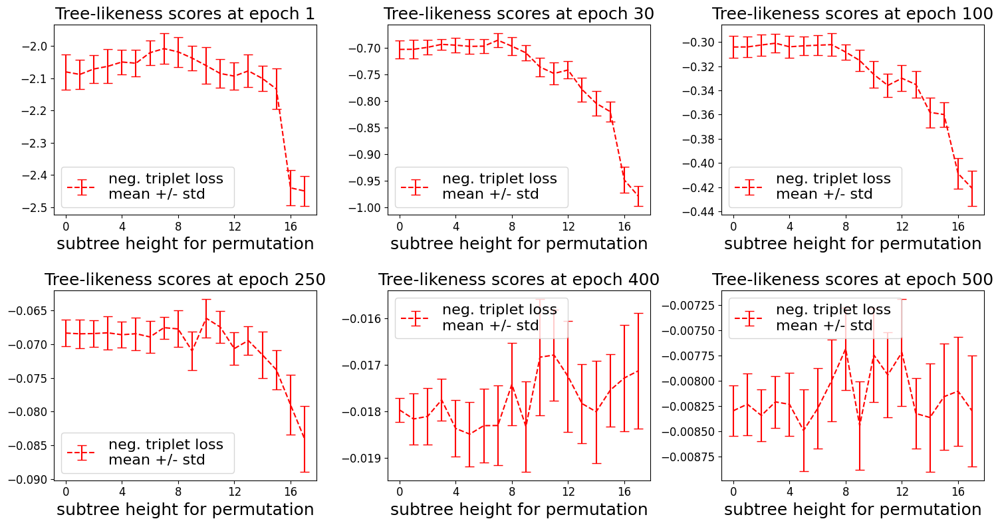

In [15]:
loss_perm_plots(name, 'AELR-2-1000', max_height=17, stops=[1, 30, 100, 250, 400, 500], max_epoch=500, gene_subset_name='_hvg', h=10)

# Figure S3

### Load data and make cell type legend

In [9]:
name = 'tedsim_l0p05_82712'

expression = get_lognorm_expression_tedsim(name)
cell_names = expression.index.values
pd.DataFrame(cell_names).to_csv(f'{data_path}/tedsim/{name}_cells.txt', index=False, columns=[0], header=False)
expression.to_csv(f'{data_path}/tedsim/{name}_normalized_log_counts.txt', index=False)
cell_types_fine = get_cell_types_tedsim(name, fine=True).loc[cell_names].values.flatten()
pd.DataFrame(cell_types_fine).to_csv(f'{data_path}/tedsim/{name}_cell_types.txt', header=False, index=False)

In [27]:
def get_hvg_genes(gene_counts):
  gene_stats = pd.DataFrame()
  gene_stats.index = gene_counts.columns
  gene_stats['mean'] = gene_counts.mean(axis=0)
  gene_stats['var'] = gene_counts.var(axis=0)
  gene_stats['pred var'] = lowess(gene_stats['var'], gene_stats['mean'], return_sorted=False, frac=1/3)

  fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 10))
  ax.plot(gene_stats['mean'], gene_stats['var'], 'ob', alpha=0.5)
  gene_stats_sorted = gene_stats.sort_values('mean')
  ax.plot(gene_stats_sorted['mean'], gene_stats_sorted['pred var'], '-r', alpha=0.5)
  ax.set_xlabel('mean of log counts')
  ax.set_ylabel('var of log counts')

  adj_gene_counts = (gene_counts - gene_counts.mean(axis=0)) / np.sqrt(gene_stats['pred var'].values)
  print('values to clip:', (np.abs(adj_gene_counts) > np.sqrt(len(gene_counts))).sum())
  adj_gene_counts = np.clip(adj_gene_counts, -np.sqrt(len(gene_counts)), np.sqrt(len(gene_counts)))

  gene_stats['adj. var'] = adj_gene_counts.var(axis=0)
  gene_stats = gene_stats.sort_values('adj. var', ascending=False)

  ax2.plot(gene_stats['mean'], gene_stats['adj. var'], 'ob', alpha=0.5)
  ax2.set_xlabel('mean of log counts')
  ax2.set_ylabel('adjusted var of log counts')
  fig.show()

  return gene_stats.index.values

In [10]:
name = 'tedsim_l0p05_82712'

tree_path = f'{data_path}/tedsim/{name}_pruned.nwk'
lut_path = f'{data_path}/tedsim/{name}_apn_pd_triplet_lut.npy'
with open(f'{data_path}/tedsim/{name}_cells.txt') as f:
  labels_in_order = np.array(f.read().splitlines())

expression = pd.read_csv(f'{data_path}/tedsim/{name}_normalized_log_counts.txt')
expression.index = labels_in_order

values to clip: 0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    0
497    0
498    0
499    0
Length: 500, dtype: int64
['292', '146', '359', '240', '336', '365', '216', '152', '499', '127', '107', '30', '238', '29', '135', '385', '102', '394', '35', '269', '34', '47', '253', '457', '377', '230', '362', '189', '251', '61', '277', '118', '98', '195', '470', '56', '327', '57', '32', '495', '417', '341', '108', '15', '17', '482', '197', '164', '27', '220', '424', '476', '46', '172', '387', '131', '212', '451', '401', '116', '37', '491', '100', '297', '232', '369', '335', '79', '87', '383', '354', '145', '151', '36', '231', '368', '453', '447', '320', '78', '194', '389', '443', '111', '222', '33', '42', '300', '319', '276', '305', '332', '92', '395', '206', '81', '322', '467', '0', '122']


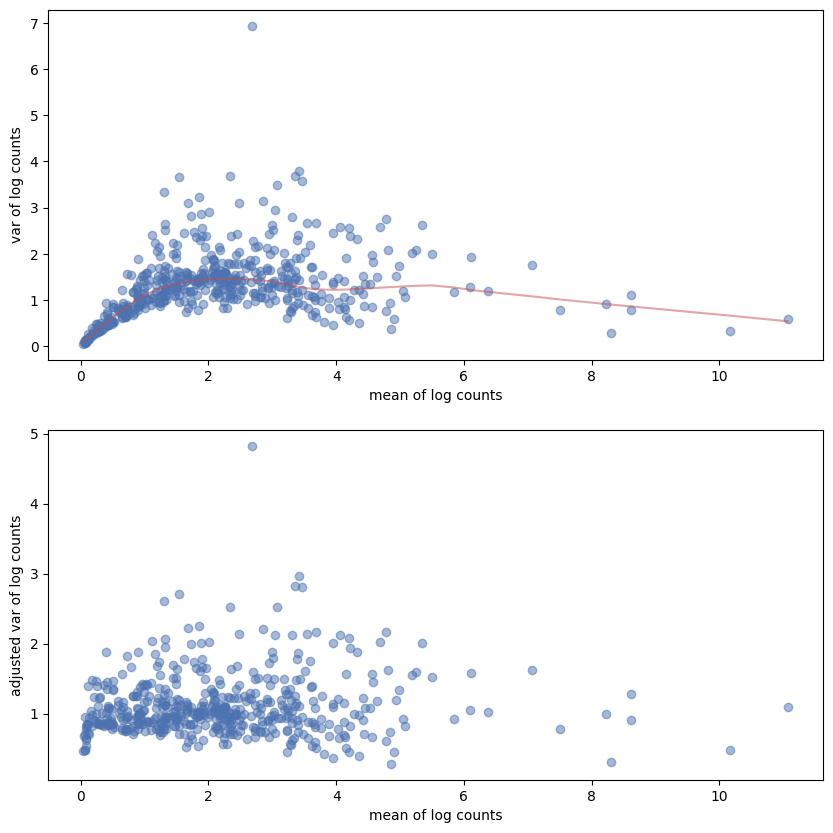

In [29]:
hvg_genes = get_hvg_genes(expression).tolist()
top_hvg_genes = hvg_genes[:100]
print(top_hvg_genes)
np.savetxt(f'{data_path}/tedsim/{name}_hvg_genes.txt', top_hvg_genes, fmt='%s')

In [11]:
with open(f'{data_path}/tedsim/{name}_hvg_genes.txt') as f:
  hvg_genes = np.array(f.read().splitlines())

cell_types = pd.read_csv(f'{data_path}/tedsim/{name}_cell_types.txt', header=None)
cell_types.columns = ['type']
cell_types.index = labels_in_order

# of cells: 512
type   
#BFD7FF    68
#F8766D    64
#619CFF    37
#FCC8C4    33
#B79F00    30
#00BA38    25
#F9A2EE    25
#F783E8    23
#FDE3E1    21
#80AFFF    21
#FA9F98    19
#FAACA7    18
#FBBAB6    15
#FBC1F3    12
#F8837B    12
#F9918A    11
#FCD5D3    11
#F564E3    10
#C3AF2A    10
#A0C3FF     9
#E7DFAA     8
#7FDC9B     7
#DBCF7F     7
#2AC559     4
#55D17A     4
#CFBF55     4
#AAE8BC     4
dtype: int64


/tmp/ipykernel_3995816/2420129016.py:19: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout()


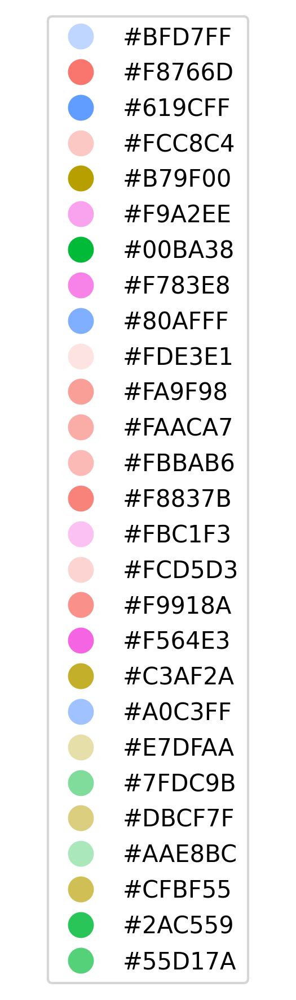

In [12]:
additional_colors = np.unique(cell_types.values)
color_df = pd.DataFrame(index=additional_colors)
color_df['color'] = color_df.index
color_df = color_df.loc[cell_types['type'].value_counts().index]

cv = cell_types.value_counts()
main_types = ['All'] + [t[0] for t in cv.index[:4]]
cv = cell_types.value_counts()
print('# of cells:', len(cell_types))
print(cv)

legend_elements = []
for color, cell_type in zip(color_df['color'], color_df.index):
  legend_elements.append(Line2D([0], [0], marker='o', lw=0, color=color, label=cell_type, markersize=10))

fig, ax = plt.subplots(figsize=(2, 2), dpi=300)
ax.axis('off')
ax.legend(handles=legend_elements, loc='center', ncol=1)
fig.tight_layout()
fig.show()

### AE training

epoch: 500; recon: 0.000865767127834; : 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 109.17it/s]


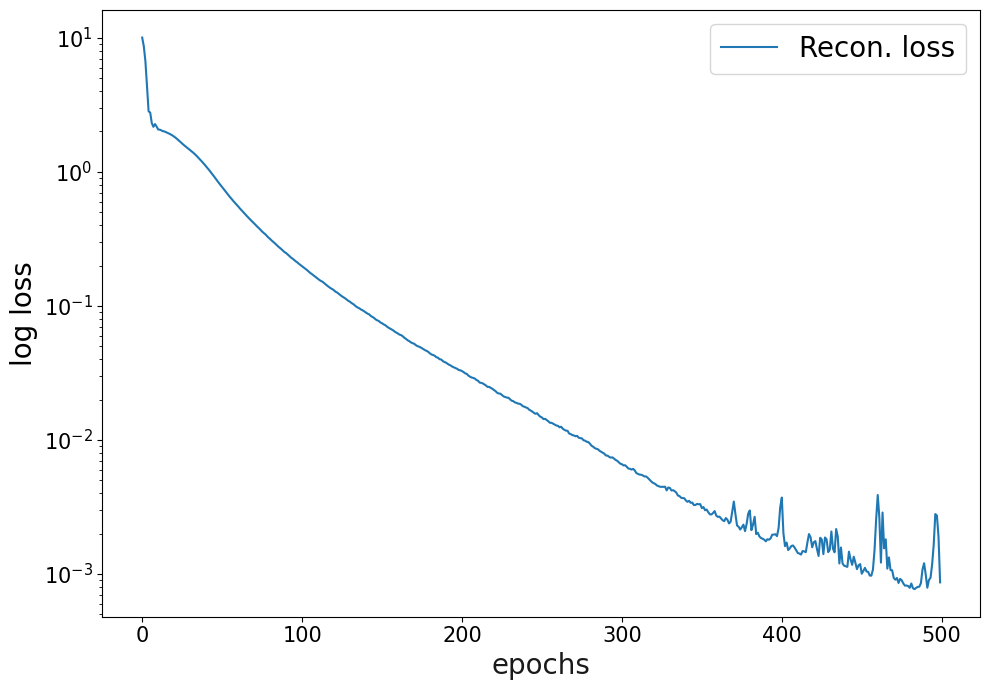

In [32]:
model = AutoEncoder(input_dim=len(hvg_genes), hidden_dim=1000, enc_layers=2, non_linearity=nn.LeakyReLU())
loss_plot = train(model, model_path=f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e500_b128_hvg.pt',
                  gene_matrix=expression[hvg_genes].values, num_epochs=500, device='cuda:0',
                  n_genes=len(hvg_genes), batch_size=128, lr=1e-4, training_seed=88232)

loading model from path ./results/ae/tedsim_l0p05_82712_AELR-2-1000_lr1em4_e500_b128_hvg.pt
done loading model from path
Pre-trained recon. loss is 0.0007675778470002115


epoch: 103; recon: 0.015671208500862; trip: 0.4953991770744; total: 0.511070370674133; :   5%|████▎                                                                                | 102/2000 [00:07<01:49, 17.28it/s]

Saved model at ./results/ae/tedsim_l0p05_82712_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e100.pt


epoch: 253; recon: 0.015375402756035; trip: 0.2535601258278; total: 0.268935531377792; :  13%|██████████▋                                                                          | 252/2000 [00:16<01:57, 14.92it/s]

Saved model at ./results/ae/tedsim_l0p05_82712_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e250.pt


epoch: 503; recon: 0.016691764816642; trip: 0.0576716288924; total: 0.074363395571709; :  25%|█████████████████████▎                                                               | 502/2000 [00:31<01:25, 17.51it/s]

Saved model at ./results/ae/tedsim_l0p05_82712_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e500.pt


epoch: 753; recon: 0.008251636289060; trip: 0.0139710325748; total: 0.022222667932510; :  38%|███████████████████████████████▉                                                     | 752/2000 [00:49<01:12, 17.11it/s]

Saved model at ./results/ae/tedsim_l0p05_82712_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e750.pt


epoch: 1003; recon: 0.005696367938071; trip: 0.0074404794723; total: 0.013136846944690; :  50%|█████████████████████████████████████████▌                                         | 1002/2000 [01:04<01:00, 16.41it/s]

Saved model at ./results/ae/tedsim_l0p05_82712_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e1000.pt


epoch: 2000; recon: 0.002592033706605; trip: 0.0008134301752; total: 0.003405463881791; : 100%|███████████████████████████████████████████████████████████████████████████████████| 2000/2000 [02:06<00:00, 15.81it/s]


Saved model at ./results/ae/tedsim_l0p05_82712_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e2000.pt
Evaluating model ...
Total rec loss: 0.002477670554071665
Total trip loss: 0.0008989543421193957


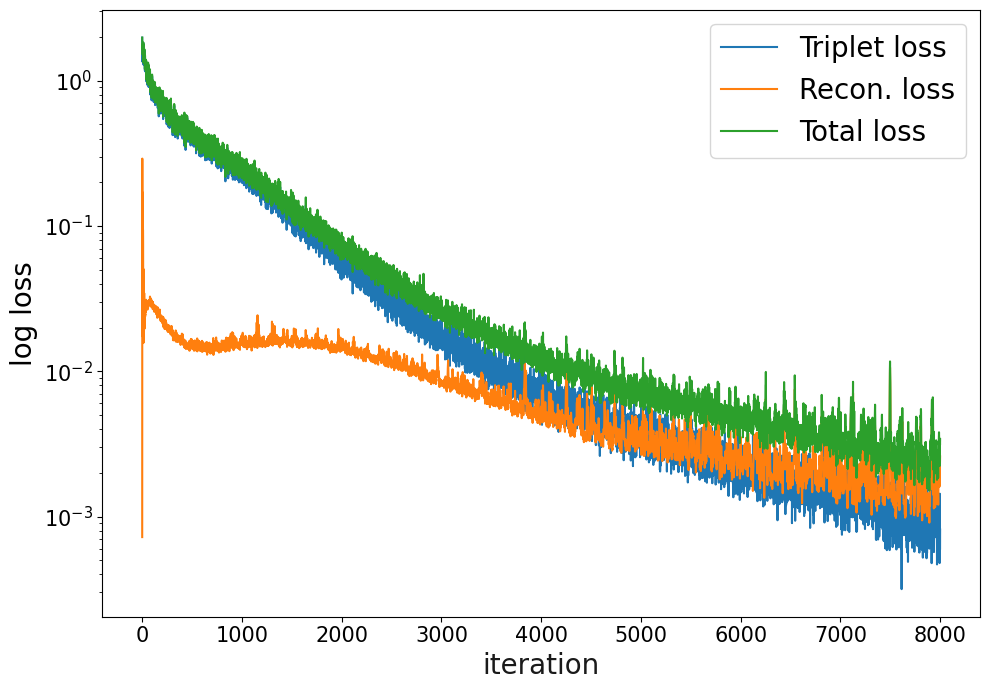

In [33]:
# train AE for 2000 epochs with triplet loss
_ = train_triplet(model=None, model_path=f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg.pt',
                  training_seed=12345, n_genes=len(hvg_genes), h=1, gene_matrix=expression[hvg_genes].values,
                  apn_lut_path=lut_path, display=True, num_epochs=2000, device='cuda:0', batch_size=128,
                  lr=1e-4, init_path=f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e500_b128_hvg.pt',
                  save_epochs=[100, 250, 500, 750, 1000, 2000])

### Trees and t-SNE

In [15]:
def get_features(model, genes, device):
  model.to(device).eval()
  with torch.no_grad():
    _, x_z = model.forward(torch.from_numpy(genes).float().to(device), return_z=True)
  return x_z.cpu().numpy()

In [16]:
np.random.seed(123121)
gene_tsne = get_tsne(expression[hvg_genes].values)
learnt_tsne = get_tsne(get_features(
    torch.load(f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e1000.pt',
               map_location=torch.device('cuda:0')),
    expression[hvg_genes].values, 'cuda:0'))

_, top_down_clusters = get_top_down_cluster_ids(tree_path, labels_in_order, depth=3)
node_data, edge_data = get_node_and_edge_data(tree_path)
interactive_plot(node_data, edge_data, labels_in_order,
                 [cell_types.loc[labels_in_order]['type'].values.tolist(), top_down_clusters],
                 ['cell types', 'top_down_clusters'],
                 [gene_tsne, learnt_tsne],
                 ['TSNE of preprocessed gene expression', 'TSNE of learnt features gene expression'],
                  additional_colors=additional_colors.tolist(),
                 ).configure_legend(orient='bottom', direction='horizontal')

/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/hschlueter/anaconda3/envs/myenv-38/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


alt.HConcatChart(...)

### Visualize data and representations

In [17]:
_, top_down_clusters = get_top_down_cluster_ids(tree_path, labels_in_order, depth=3)

color_df2 = pd.DataFrame(index=kp_color_domain)
color_df2['color'] = nice_colors
color_df2 = color_df2.loc[np.unique(top_down_clusters)]

cell_types_array = cell_types.loc[labels_in_order]['type'].values
features = get_features(torch.load(f'{results_path}/ae/{name}_AELR-2-1000_lr1em4_e2000_b128_h1_pd_pre_ts12345_hvg_e1000.pt',
               map_location=torch.device('cuda:0')),
                        expression[hvg_genes].values, 'cuda:0')

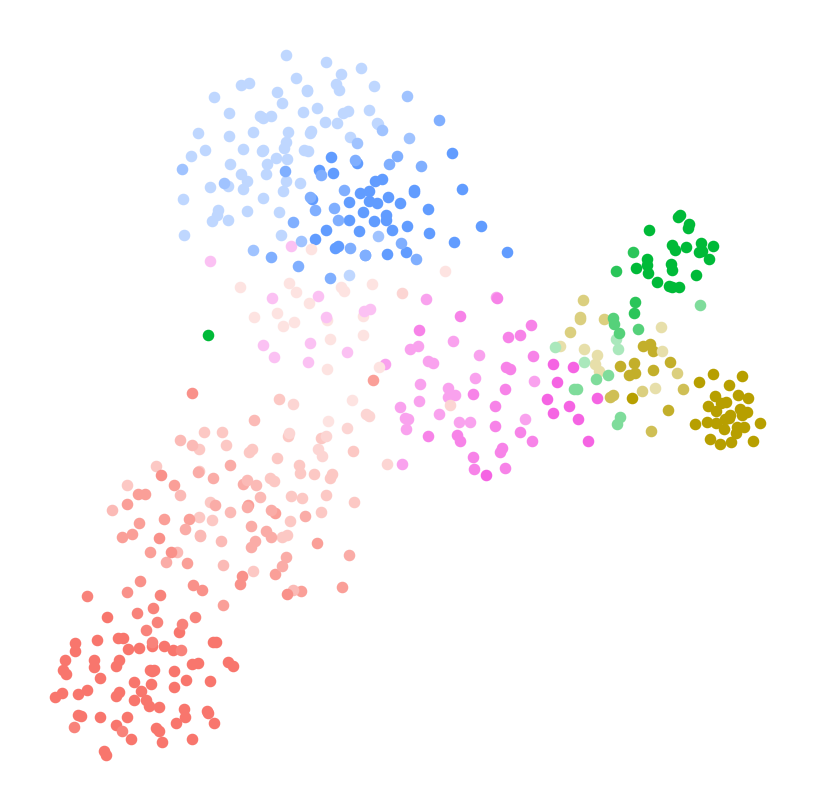

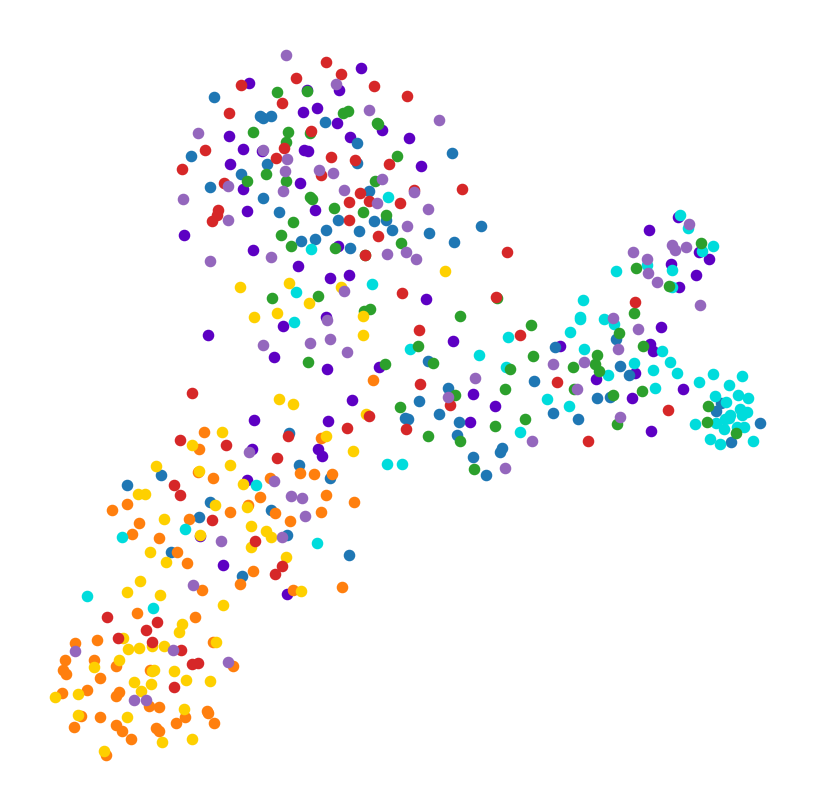

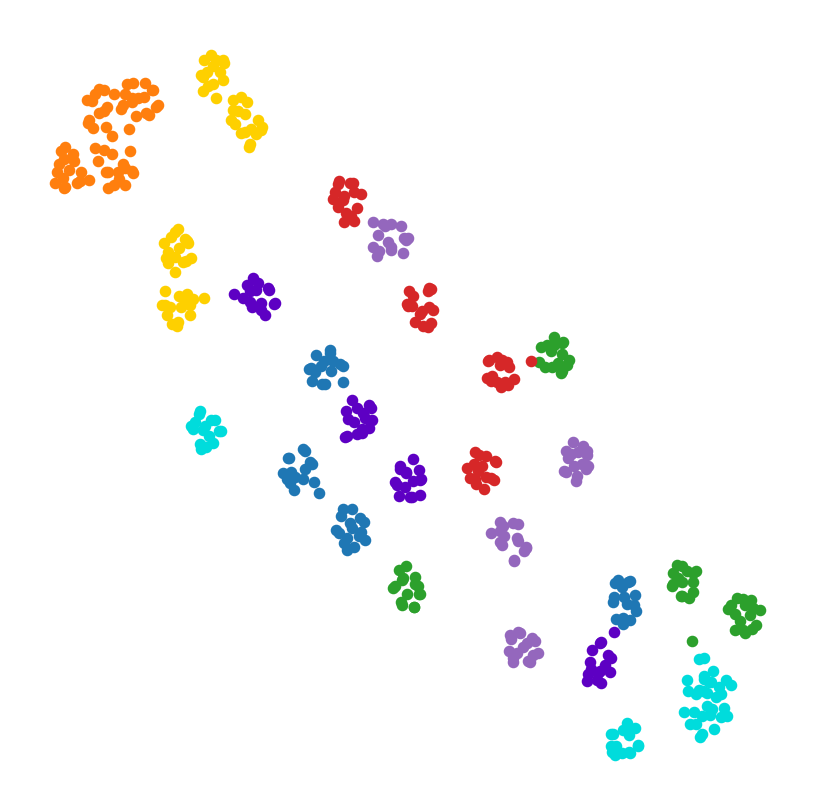

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df.itertuples():
  ax.scatter(x=gene_tsne[cell_types_array == t, 0], y=gene_tsne[cell_types_array == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=gene_tsne[top_down_clusters == t, 0], y=gene_tsne[top_down_clusters == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=learnt_tsne[top_down_clusters == t, 0], y=learnt_tsne[top_down_clusters == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

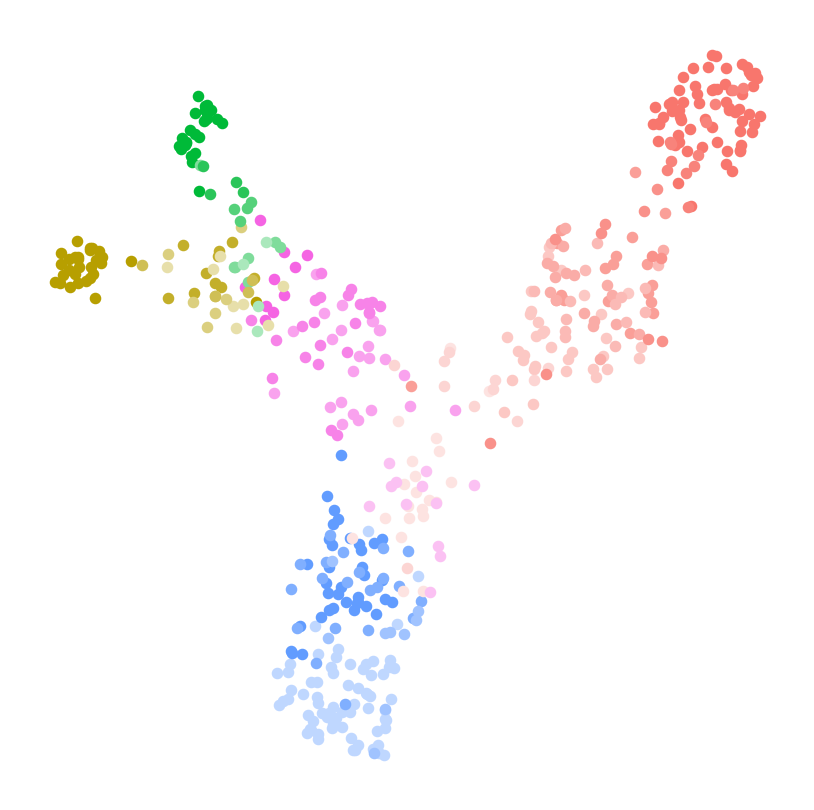

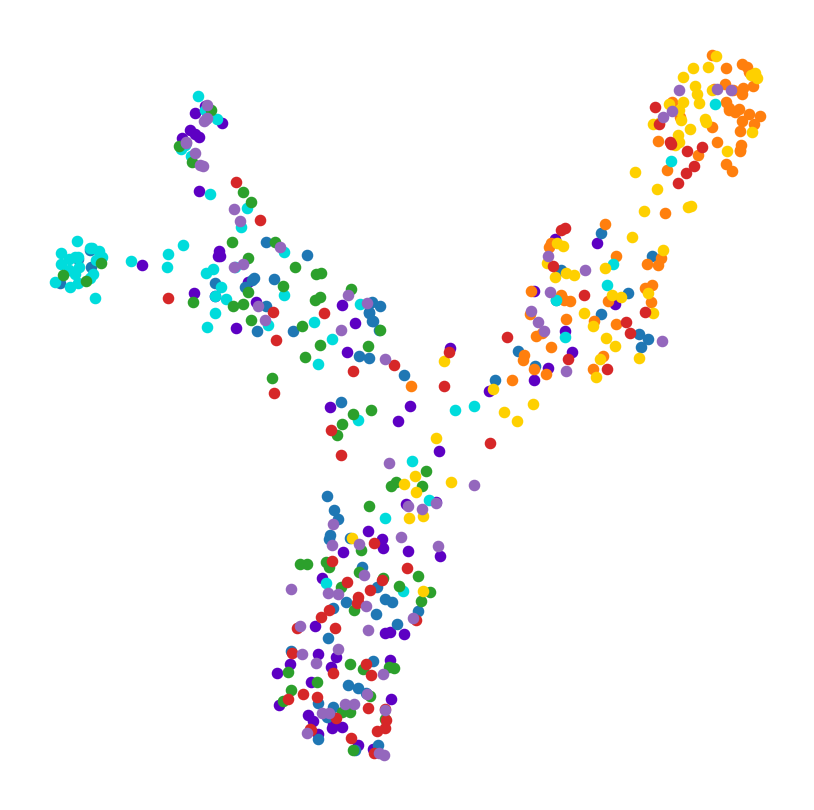

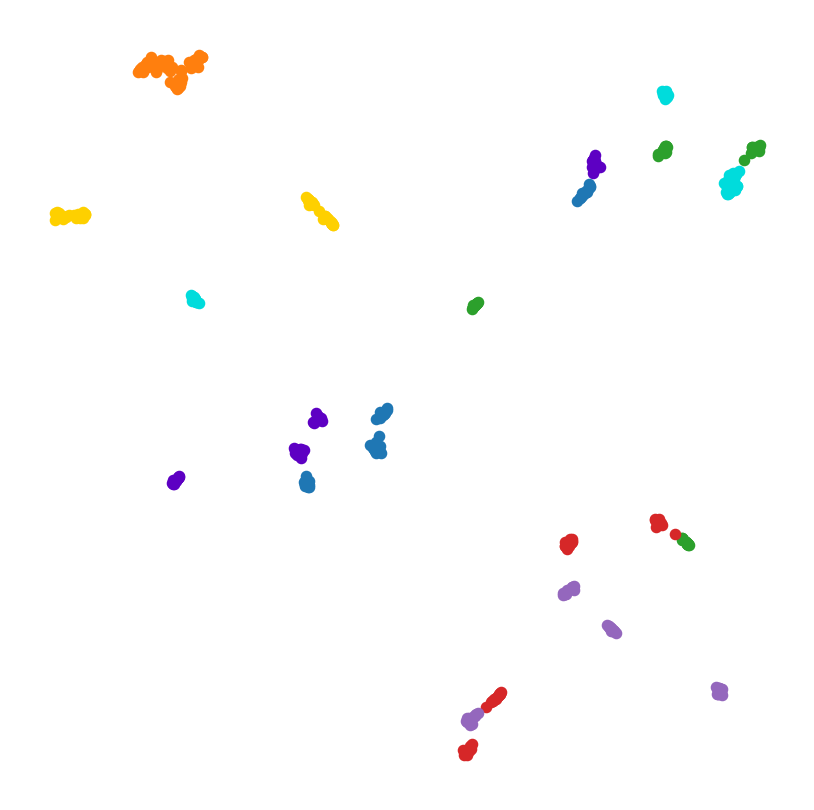

In [19]:
def get_umap(features):
  return umap.UMAP().fit_transform(features)

np.random.seed(123121)
gene_umap = get_umap(expression[hvg_genes].values)
learnt_umap = get_umap(features)

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df.itertuples():
  ax.scatter(x=gene_umap[cell_types_array == t, 0], y=gene_umap[cell_types_array == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=gene_umap[top_down_clusters == t, 0], y=gene_umap[top_down_clusters == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=learnt_umap[top_down_clusters == t, 0], y=learnt_umap[top_down_clusters == t, 1], color=c, s=10)
ax.axis('off')
fig.show()

In [20]:
def get_pca2(features):
  return PCA(n_components=2).fit_transform(features)

np.random.seed(123121)
gene_pca = get_pca2(expression[hvg_genes].values)
learnt_pca = get_pca2(features)

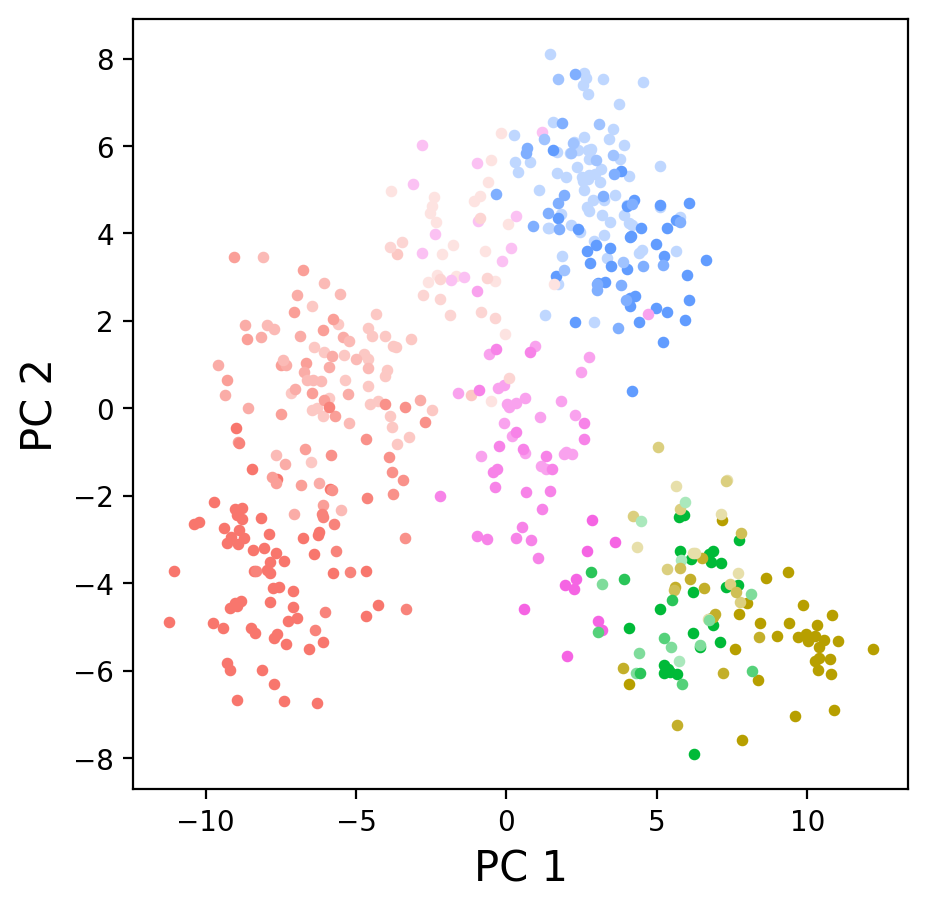

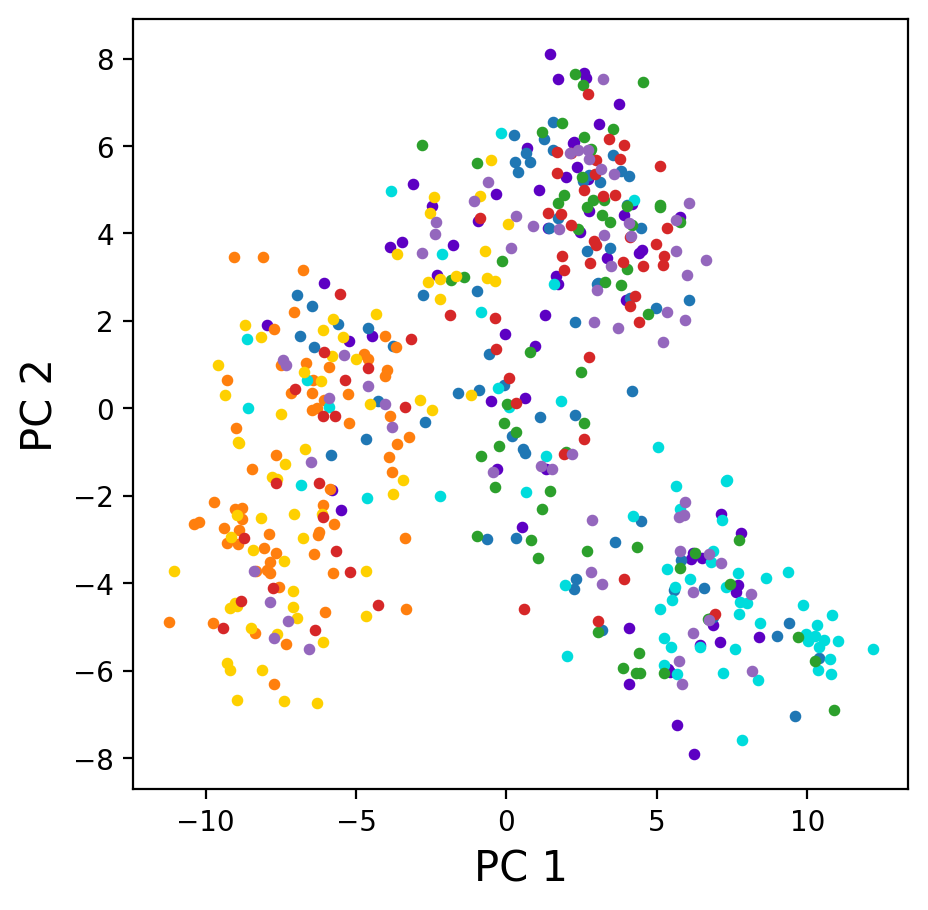

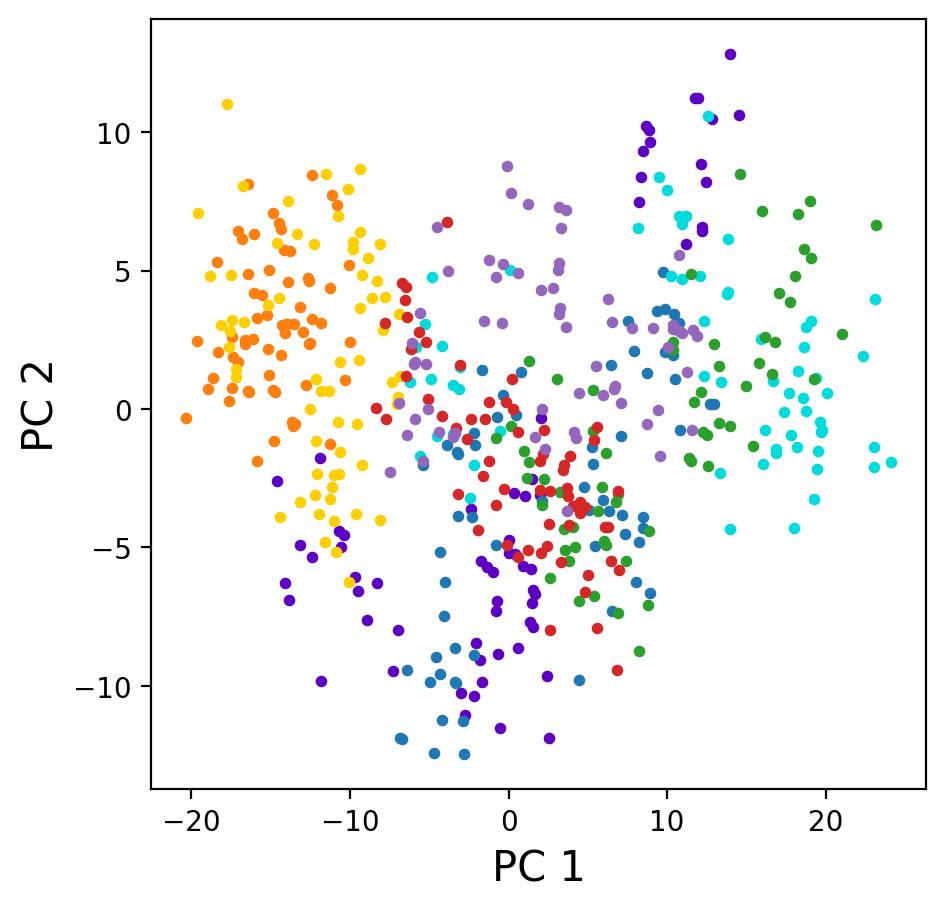

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df.itertuples():
  ax.scatter(x=gene_pca[cell_types_array == t, 0], y=gene_pca[cell_types_array == t, 1], color=c, s=10)
ax.set_xlabel('PC 1', fontsize=15)
ax.set_ylabel('PC 2', fontsize=15)
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=gene_pca[top_down_clusters == t, 0], y=gene_pca[top_down_clusters == t, 1], color=c, s=10)
ax.set_xlabel('PC 1', fontsize=15)
ax.set_ylabel('PC 2', fontsize=15)
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=learnt_pca[top_down_clusters == t, 0], y=learnt_pca[top_down_clusters == t, 1], color=c, s=10)
ax.set_xlabel('PC 1', fontsize=15)
ax.set_ylabel('PC 2', fontsize=15)
fig.show()

In [22]:
# local copy of https://github.com/facebookresearch/PoincareMaps
from PoincareMaps.main import compute_poincare_maps

def get_poincare(features, labels):
  features = torch.from_numpy(features)
  poincare_coord, _ = compute_poincare_maps(
      features, labels, 'example', mode='features', k_neighbours=15,
      distlocal='minkowski', sigma=1.0, gamma=2.0, color_dict=None, epochs=500,
      batchsize=-1, lr=0.1, earlystop=0.0001, cuda=1)
  return poincare_coord

np.random.seed(123121)
gene_poincare = get_poincare(expression[hvg_genes].values, labels_in_order)
pd.DataFrame(gene_poincare).to_csv(f'{results_path}/vis/{name}_hvg_poincare.csv', header=False, index=False)
learnt_poincare = get_poincare(features, labels_in_order)
pd.DataFrame(learnt_poincare).to_csv(f'{results_path}/vis/{name}_ae_poincare.csv', header=False, index=False)

Computing laplacian...
Laplacian computed in 0.02 sec
Computing RFA...
RFA computed in 0.02 sec
batchsize =  51
Starting training...


loss: 0.24840:   9%|██▍                        | 44/500 [00:00<00:08, 52.22it/s]

loss: 0.18955: 100%|██████████████████████████| 500/500 [00:10<00:00, 46.38it/s]


PM computed in 10.78 sec
loss = 1.895e-01
time = 0.181 min
Computing laplacian...
Laplacian computed in 0.02 sec
Computing RFA...
RFA computed in 0.01 sec
batchsize =  51
Starting training...


loss: 0.24959: 100%|██████████████████████████| 500/500 [00:10<00:00, 45.93it/s]


PM computed in 10.89 sec
loss = 2.496e-01
time = 0.183 min


In [23]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
%matplotlib inline

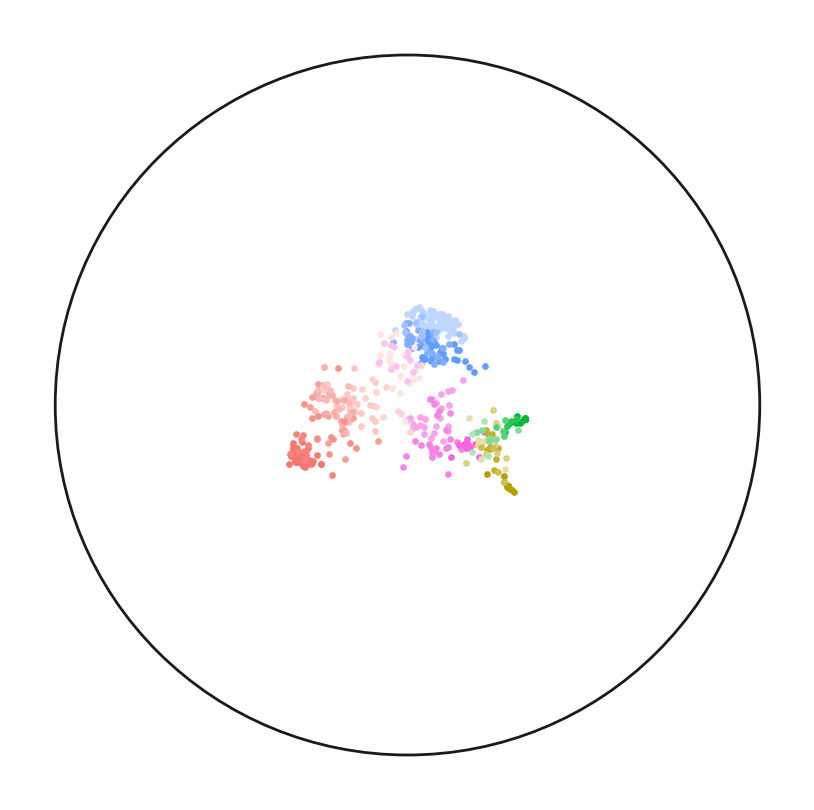

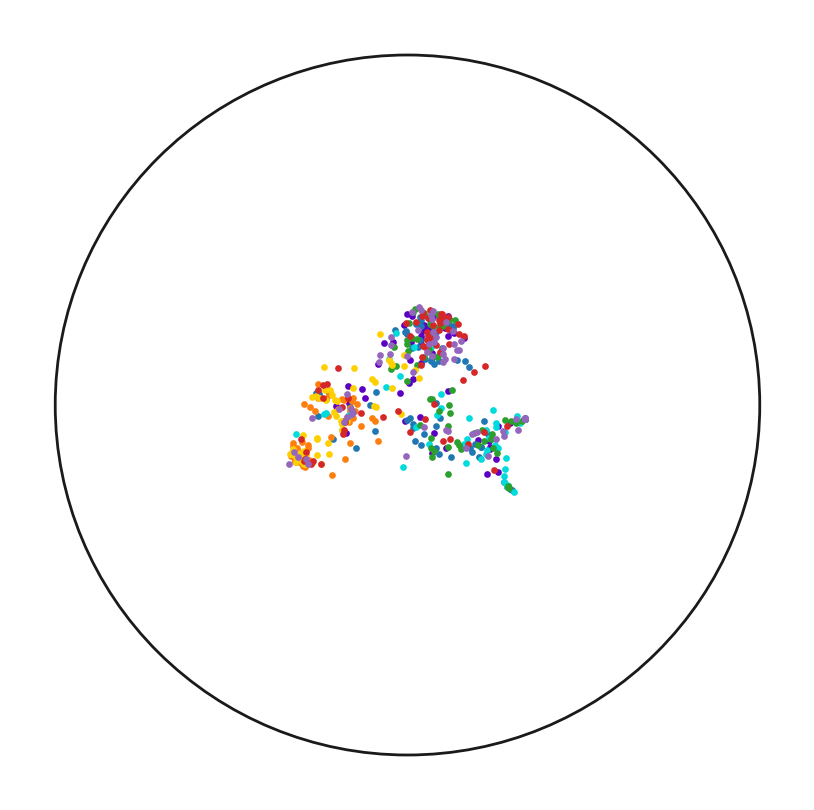

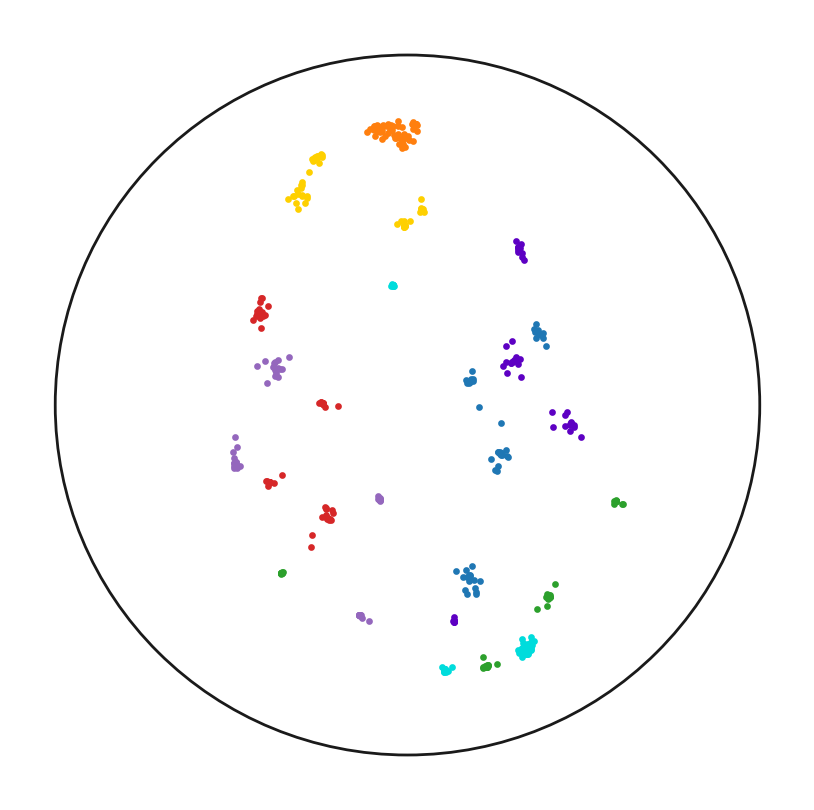

In [24]:
gene_poincare = pd.read_csv(f'{results_path}/vis/{name}_hvg_poincare.csv', header=None).values
learnt_poincare = pd.read_csv(f'{results_path}/vis/{name}_ae_poincare.csv', header=None).values

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df.itertuples():
  ax.scatter(x=gene_poincare[cell_types_array == t, 0], y=gene_poincare[cell_types_array == t, 1], color=c, s=2)

circle = plt.Circle((0, 0), 1, color='k', fill=False)
ax.add_patch(circle)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=gene_poincare[top_down_clusters == t, 0], y=gene_poincare[top_down_clusters == t, 1], color=c, s=2)

circle = plt.Circle((0, 0), 1, color='k', fill=False)
ax.add_patch(circle)
ax.axis('off')
fig.show()

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=200)
for t, c in color_df2.itertuples():
  ax.scatter(x=learnt_poincare[top_down_clusters == t, 0], y=learnt_poincare[top_down_clusters == t, 1], color=c, s=2)

circle = plt.Circle((0, 0), 1, color='k', fill=False)
ax.add_patch(circle)
ax.axis('off')
fig.show()